In [2]:
import pandas as pd
from pathlib import Path
import os

parent_directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline"

dataframes = []

for folder_name in os.listdir(parent_directory):
    folder_path = os.path.join(parent_directory, folder_name)
    
    if os.path.isdir(folder_path):
        if "max_freqs_log_likelyhood_esm2_" in folder_name: 
            for filename in os.listdir(folder_path):
                if filename.endswith(".csv"):
                    file_path = os.path.join(folder_path, filename)
                    
                    Segment = filename.rsplit('_', 1)[-1].replace('.csv', '')
                    Model = filename.rsplit('_', 4)[-3].replace('.csv', '')

                    df_merge = pd.read_csv(file_path)
                    df_merge['Segment'] = Segment.upper()
                    df_merge['Model'] = Model
                    dataframes.append(df_merge)

                df_all_segements_all_models = pd.concat(dataframes)

In [2]:
df_all_segements_all_models

,node,max_frequency,sequence,log_likelyhood,runtime,Segment,Model
0,NODE_0000001,1.000006,MDSNTVSSFQVDCFLWHVRKQVVDQELGDAPFLDRLRRDQKSLRGR...,-106.938126,185.333,NS,15B
1,A/Aichi/2/1968-egg,0.071429,MDSNTVSSFQVDCFLWHVRKQVVDQELGDAPFLDRLRRDQKSLRGR...,-106.689514,185.333,NS,15B
2,NODE_0000002,1.000006,MDSNTVSSFQVDCFLWHVRKQVVDQELGDAPFLDRLRRDQKSLRGR...,-106.938126,185.333,NS,15B
3,NODE_0000007,0.800000,MDSNTVSSFQVDCFLWHVRKQVVDQELGDAPFLDRLRRDQKSLRGR...,-106.938126,185.333,NS,15B
4,A/Albany/4/1969-egg,0.142857,MDSNTVSSFQVDCFLWHVRKQVVDQELGDAPFLDRLRRDQKSLRGR...,-106.938126,185.333,NS,15B
...,...,...,...,...,...,...,...
1422,A/Michigan/UOM10049574069/2023,0.062299,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-345.390991,327.000,PA,3B
1423,A/SouthAfrica/PET28958/2023,0.148849,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-345.390991,327.000,PA,3B
1424,NODE_0001008,0.533565,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-346.293213,327.000,PA,3B
1425,A/Singapore/NTF0007/2022,0.533565,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-346.293213,327.000,PA,3B


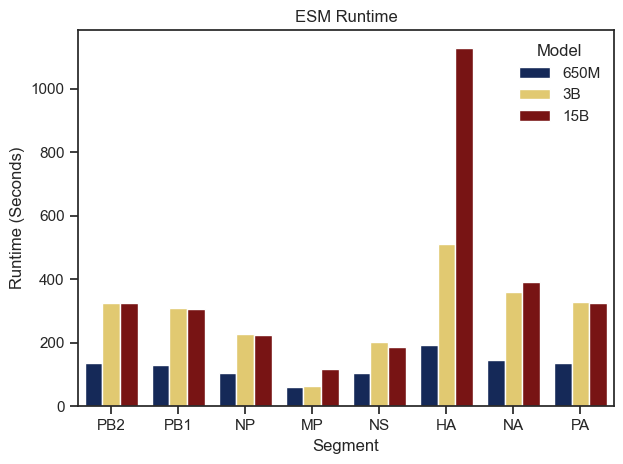

In [84]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

model_order = ['650M', '3B', '15B']

palette = {
    '650M': '#0a2463',
    '3B': '#f4d35e',
    '15B': '#890304'
}

df_all_segements_all_models['Model'] = pd.Categorical(
    df_all_segements_all_models['Model'], 
    categories=model_order, 
    ordered=True
)

df_all_segements_all_models = df_all_segements_all_models.sort_values('Model')

#sns.color_palette("pastel")

sns.barplot(
    data=df_all_segements_all_models, 
    x='Segment', 
    y='runtime', 
    hue='Model', 
    hue_order=model_order,  
    errorbar=None,
    palette=palette
)

plt.title("ESM Runtime")
plt.xlabel("Segment")
plt.ylabel("Runtime (Seconds)")
plt.legend(title="Model",frameon=False, loc='upper right')
plt.tight_layout()

plt.show()

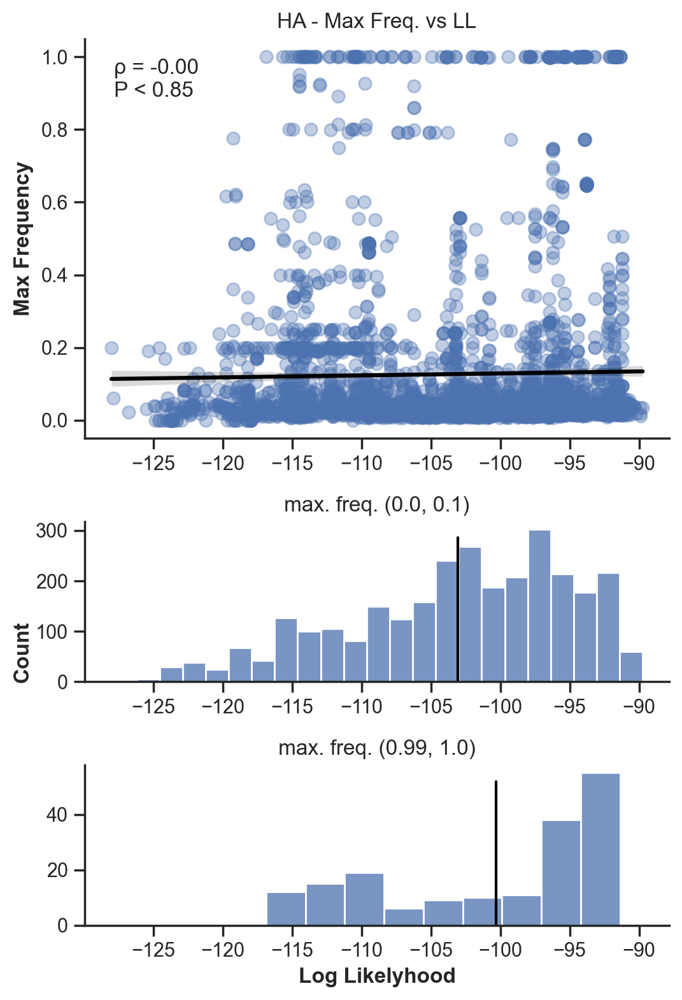

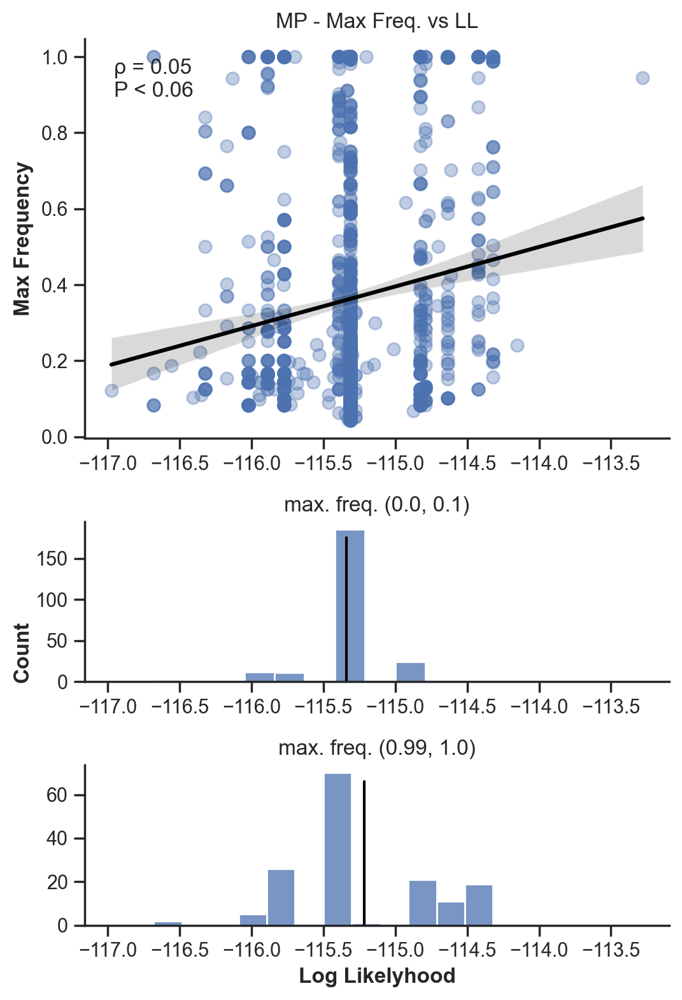

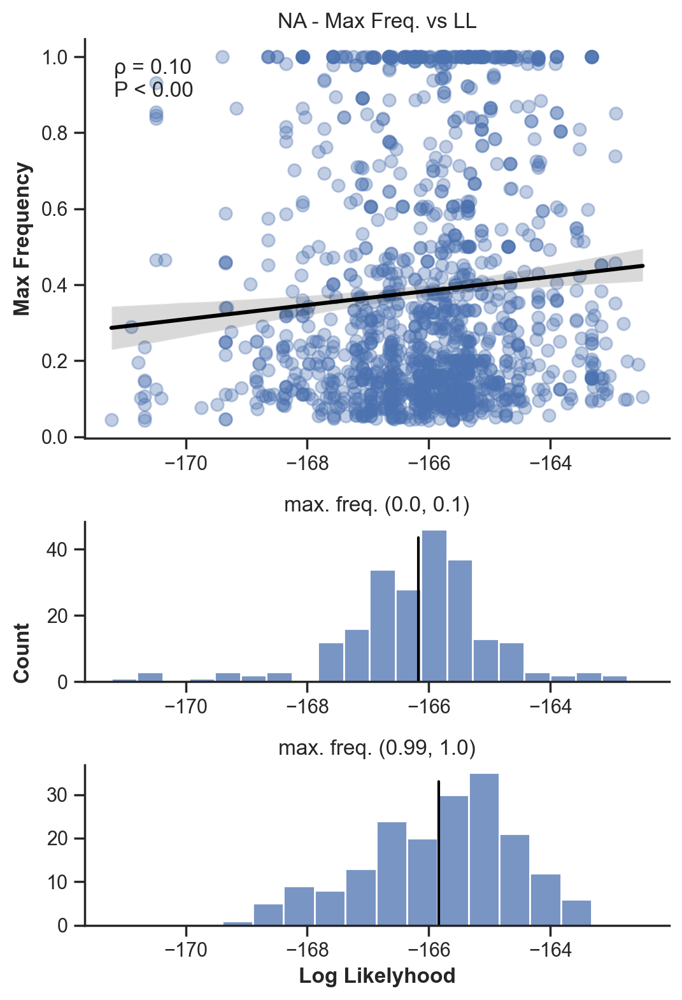

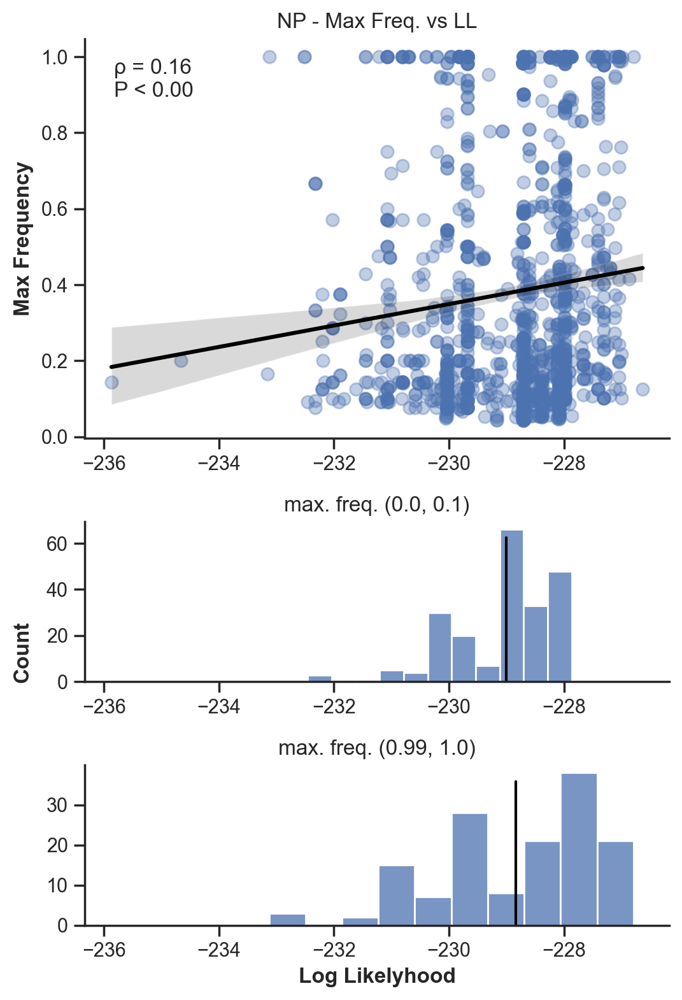

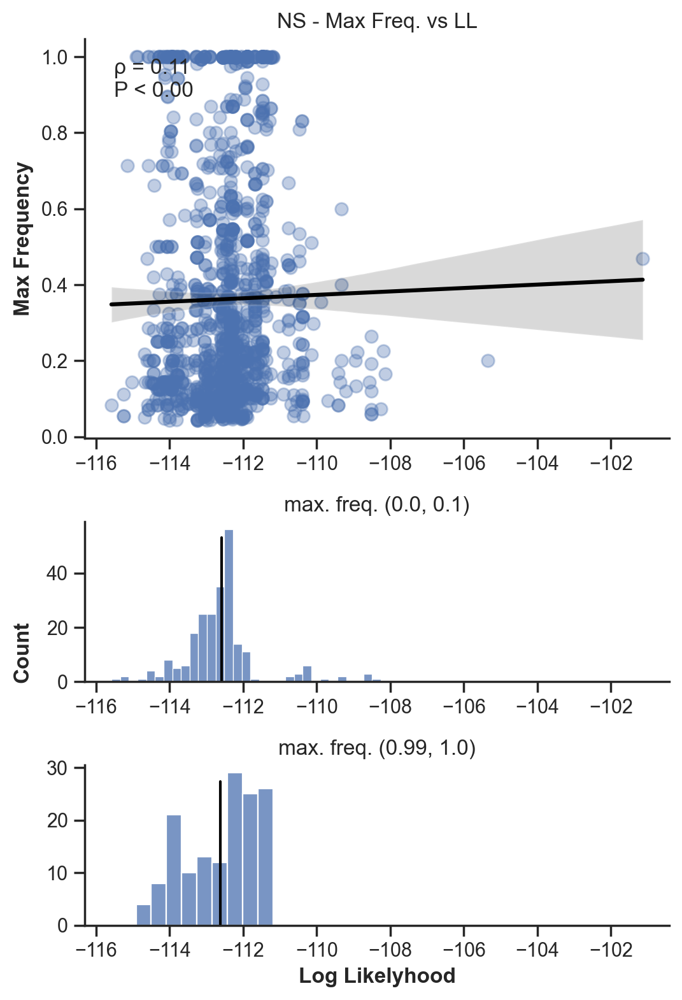

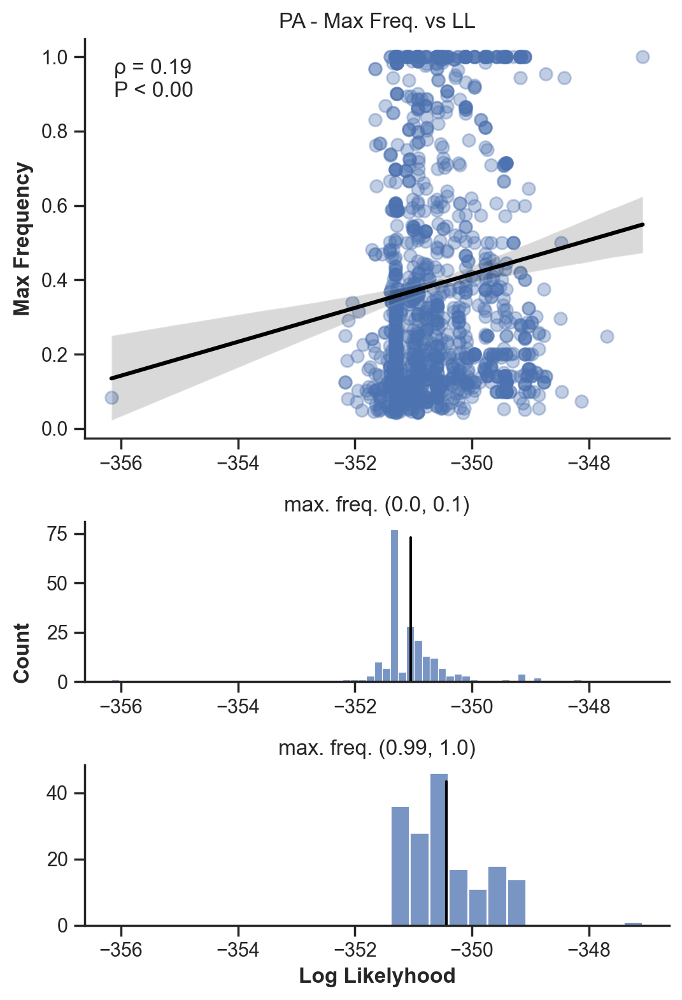

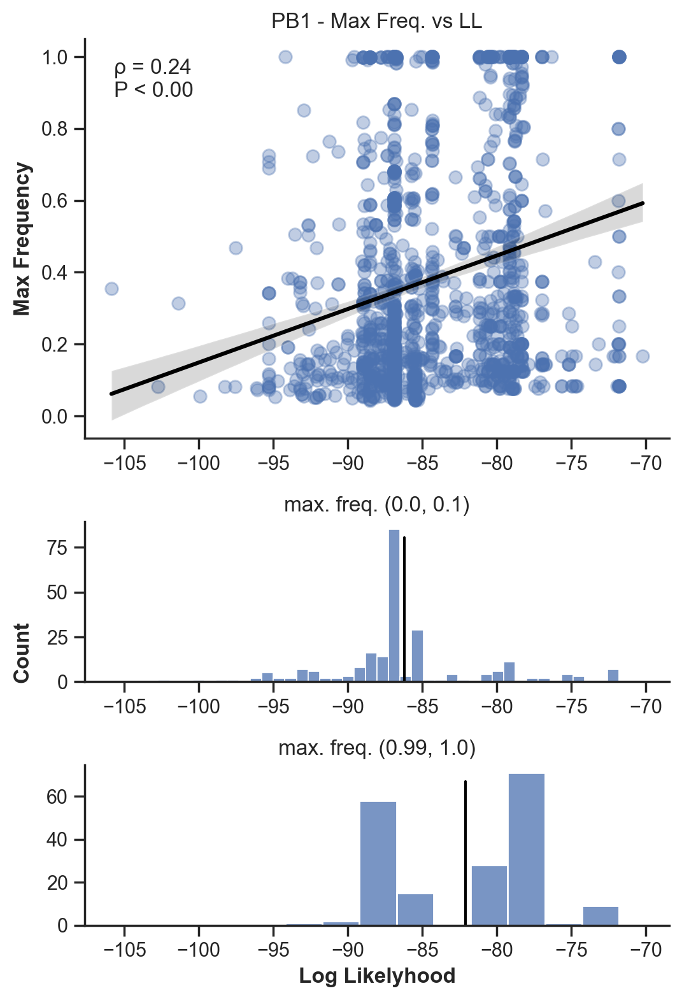

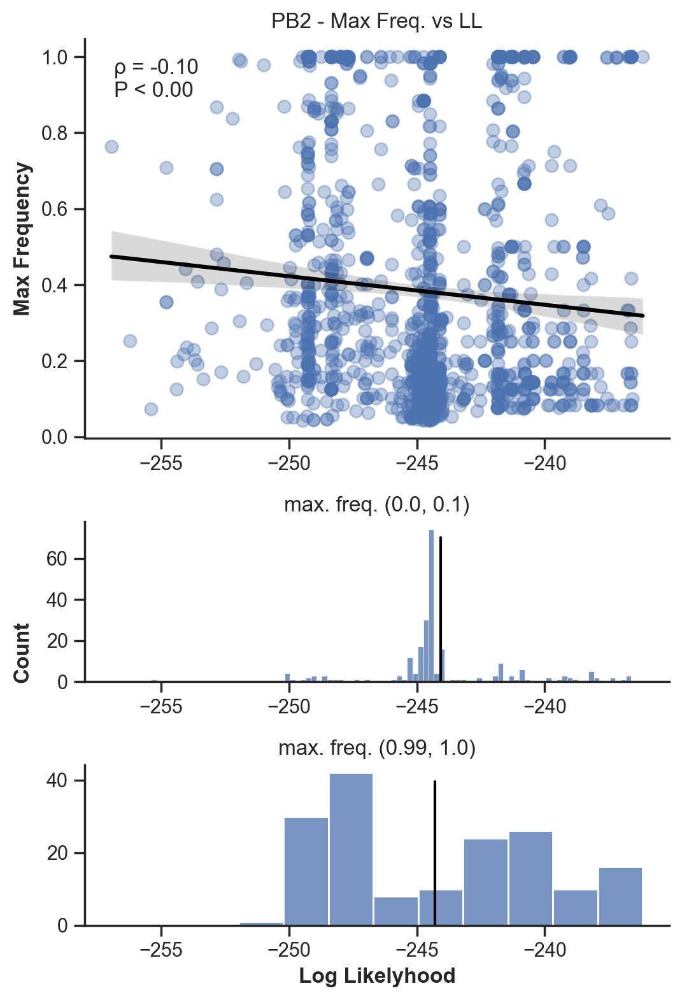

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib import gridspec
from scipy.stats import spearmanr

# Look nicer in Jupyter on Mac
#%config InlineBackend.figure_format = 'retina'

directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t48_15B_UR50D"
output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_vs_Max_Freq_Plots")


os.makedirs(output_dir, exist_ok=True)

sns.set_theme(style="whitegrid")
sns.set_style("ticks")

df_all_segements_all_model_filtered = df_all_segements_all_models[df_all_segements_all_models['Model'] == '650M']

for segment, group in df_all_segements_all_model_filtered.groupby('Segment'):
        
        df = df_all_segements_all_model_filtered[df_all_segements_all_model_filtered['Segment'] == segment]


        if segment == "PA":
          df = df[df['node'] != 'A/Viamao/LACENRS-974/2015']

        df_below_01 = df[df['max_frequency'] < 0.1]
        df_above_1 = df[df['max_frequency'] >= 0.99]

        fig = plt.figure(figsize=(5.5, 8))
        gs = gridspec.GridSpec(3, 1, height_ratios=[1, 0.4, 0.4]) 

        ax = fig.add_subplot(gs[0])
        ax1 = fig.add_subplot(gs[1], sharex=ax)
        ax2 = fig.add_subplot(gs[2], sharex=ax)

        sns.set_theme(style="whitegrid")
        sns.set_style("ticks")
        sns.regplot(data=df, y="max_frequency", x="log_likelyhood", ax=ax, scatter_kws={'s': 50, 'alpha': 0.35}, line_kws={'color': 'black'})
        
        ax.set_title(f"{segment.upper()} - Max Freq. vs LL")
        ax.set_xlabel("")

        spearman_corr, p_value = spearmanr(df['max_frequency'], df['log_likelyhood'])

        textstr = (
            f'ρ = {spearman_corr:.2f}\n'
            f'P < {p_value:.2f}\n'
        )

        ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.0))

        ax.set_ylabel("Max Frequency", weight='bold')

        mean_below_01 = df_below_01['log_likelyhood'].mean()

        sns.histplot(data=df_below_01, x="log_likelyhood", ax=ax1)
        ax1.set_title("max. freq. (0.0, 0.1)")
        ax1.axvline(mean_below_01, color='black', linestyle='-', linewidth=1.5, ymax=0.9)
        ax1.set_ylabel("")
        ax1.set_xlabel("")

        mean_above_1 = df_above_1['log_likelyhood'].mean()

        sns.histplot(data=df_above_1, x="log_likelyhood", ax=ax2)
        ax2.set_title("max. freq. (0.99, 1.0)")
        ax2.axvline(mean_above_1, color='black', linestyle='-', linewidth=1.5, ymax=0.9)
        ax2.set_ylabel("")
        ax2.set_xlabel("Log Likelyhood", weight='bold')

        fig.text(0.03, 0.35, 'Count', va='center', rotation='vertical', fontsize=12, weight='bold')

        ax.spines[['right', 'top']].set_visible(False)
        ax1.spines[['right', 'top']].set_visible(False)
        ax2.spines[['right', 'top']].set_visible(False)


        plt.tight_layout()

        #plt.show()

        #output_path = os.path.join("/Users/Carlos/Downloads/ESM_vs_Max_Freq_Plots/", f"LL_vs_Max_Frequency_{segment}.png")
        #plt.savefig(output_path, dpi=300)
        #plt.close()

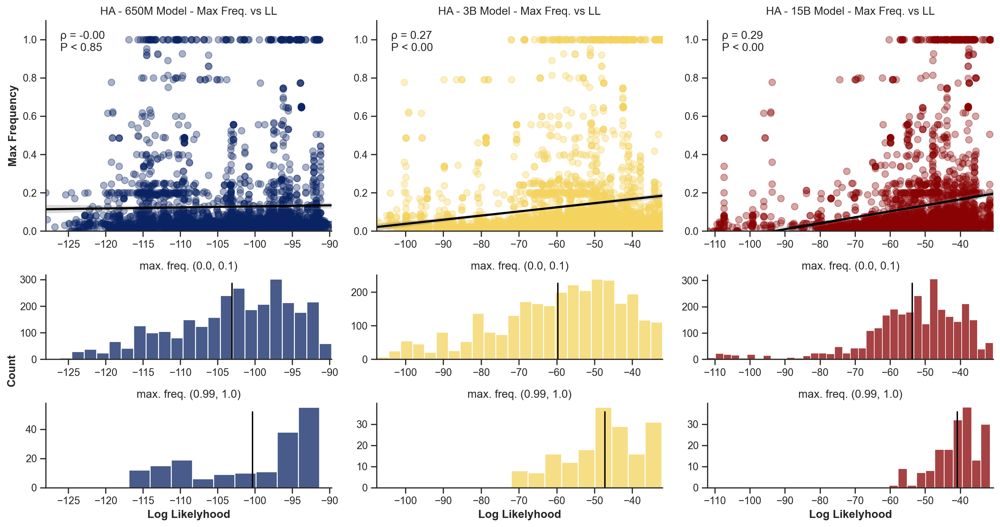

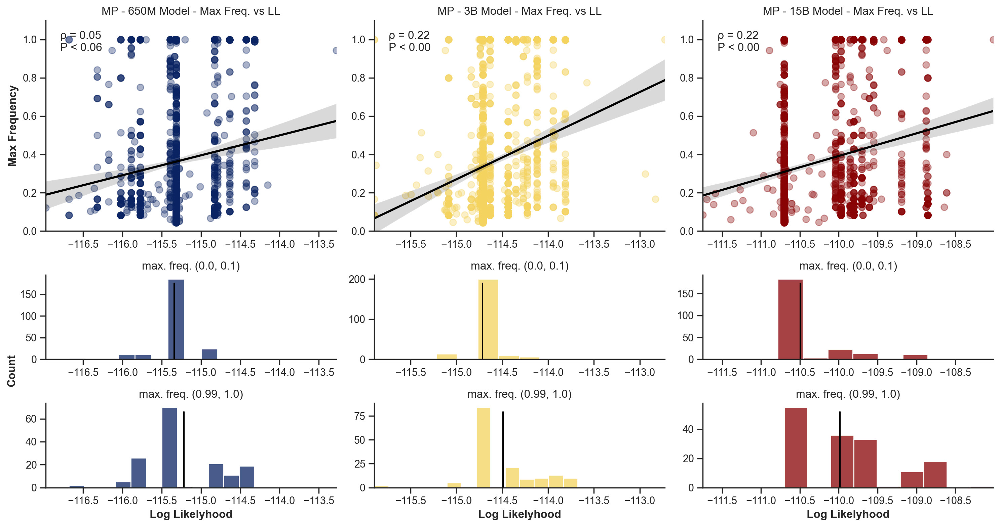

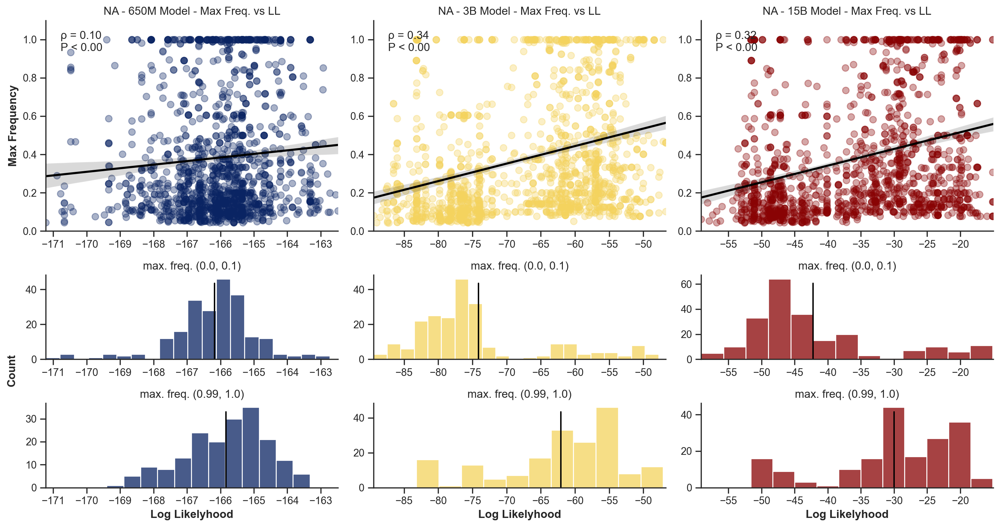

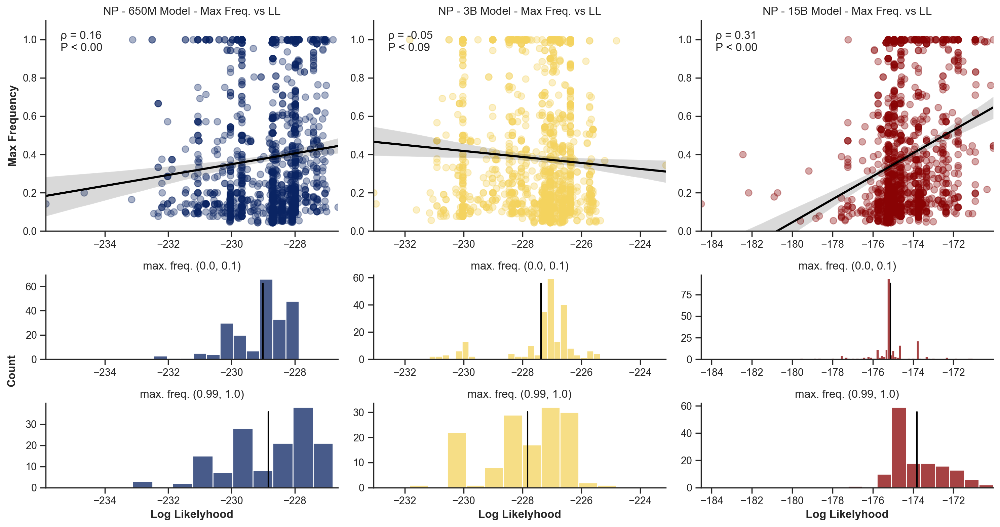

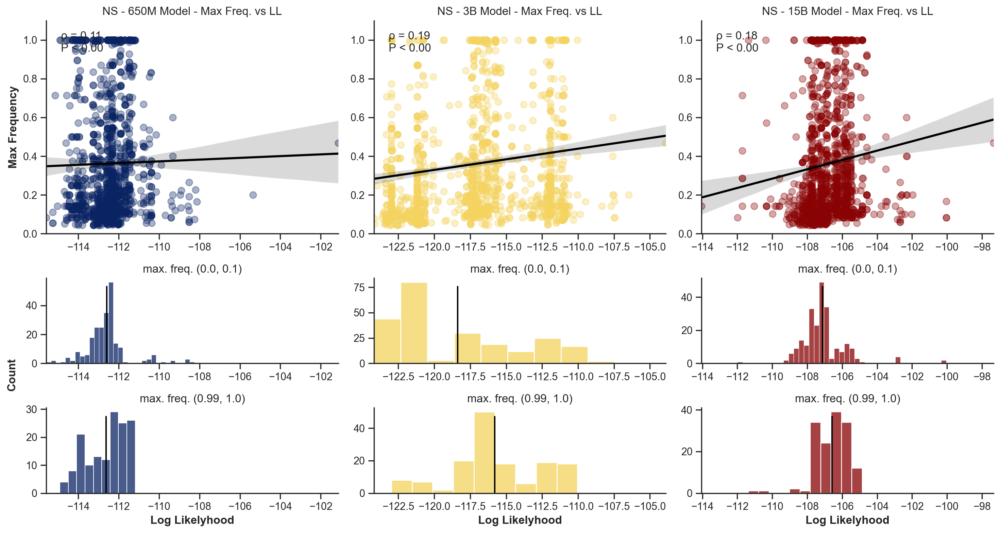

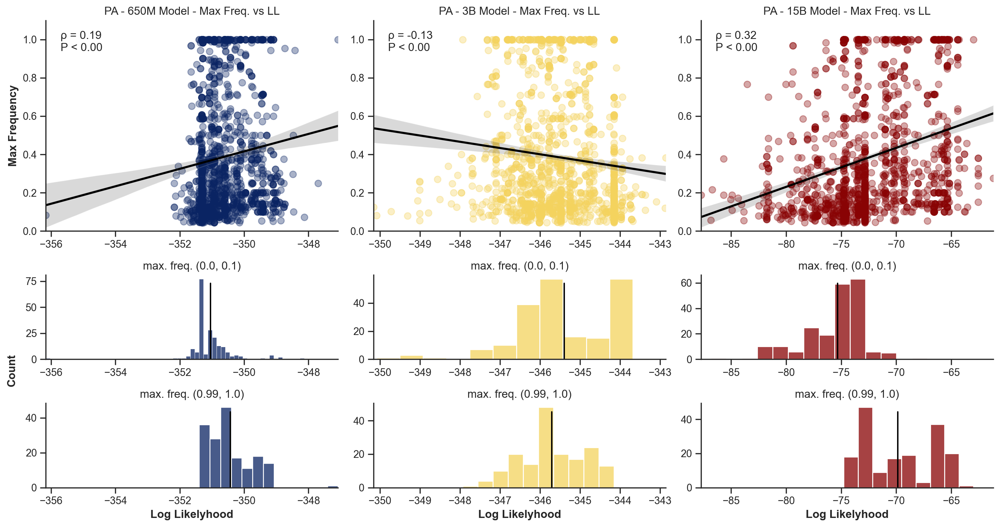

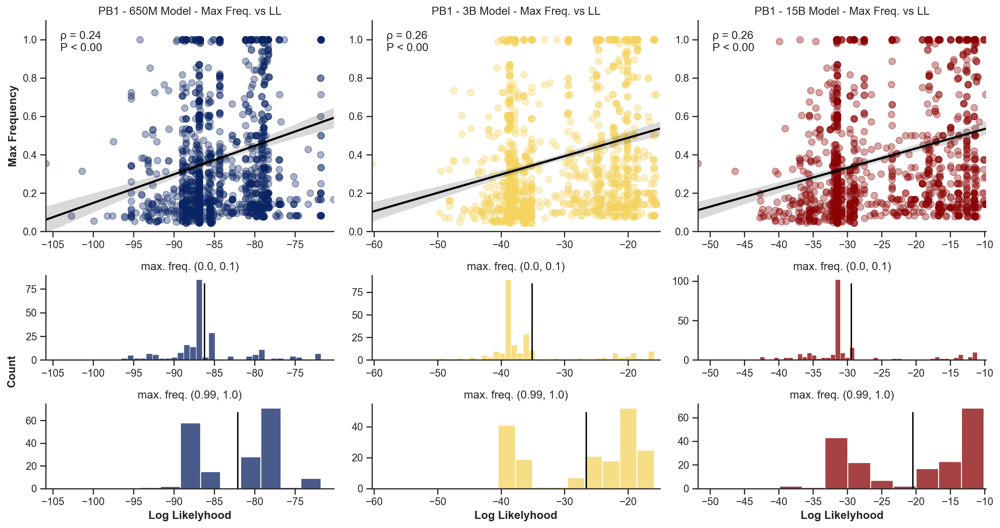

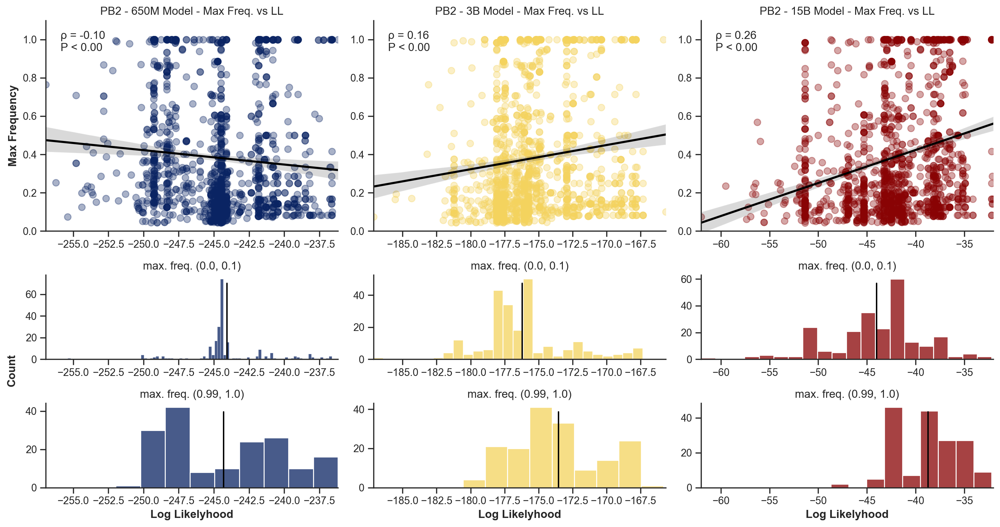

In [ ]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib import gridspec
from scipy.stats import spearmanr

# Look nicer in Jupyter on Mac
#%config InlineBackend.figure_format = 'retina'

#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t48_15B_UR50D"
output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_vs_Max_Freq_Plots")

os.makedirs(output_dir, exist_ok=True)

sns.set_theme(style="whitegrid")
sns.set_style("ticks")

def plot_regression(ax, data, x_col, y_col, title, ylabel="", color="#0a2463"):
    sns.regplot(data=data, y=y_col, x=x_col, ax=ax, scatter_kws={'s': 50, 'alpha': 0.35, 'color': color}, line_kws={'color': 'black'})
    ax.set_title(title)
    ax.set_xlabel("")
    spearman_corr, p_value = spearmanr(data[y_col], data[x_col])
    textstr = (
        f'ρ = {spearman_corr:.2f}\n'
        f'P < {p_value:.2f}\n'
    )
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.0))
    ax.set_ylabel(ylabel, weight='bold')
    ax.set_xlim(data[x_col].min(), data[x_col].max())
    ax.set_ylim(0, 1.1)

def plot_histogram(ax, data, mean_value, title, xlabel="", color="#0a2463"):
    sns.histplot(data=data, x="log_likelyhood", ax=ax, color= color)
    ax.set_title(title)
    ax.axvline(mean_value, color='black', linestyle='-', linewidth=1.5, ymax=0.9)
    ax.set_ylabel("")
    ax.set_xlabel(xlabel, weight='bold' if xlabel else 'normal')

segment = "MP"

for segment, group in df_all_segements_all_models.groupby('Segment'):

    fig = plt.figure(figsize=(5 * 3, 8))
    gs_main = gridspec.GridSpec(3, 3, height_ratios=[1, 0.4, 0.4])

    df = df_all_segements_all_models[df_all_segements_all_models['Segment'] == segment]

    if segment == "PA":
        df = df[df['node'] != 'A/Viamao/LACENRS-974/2015']

    df_650 = df[df['Model'] == "650M"]
    df_3B = df[df['Model'] == "3B"]
    df_15B = df[df['Model'] == "15B"]

    df_below_1_650 = df_650[df_650['max_frequency'] < 0.1]
    df_above_1_650 = df_650[df_650['max_frequency'] >= 0.99]
    df_below_1_3B = df_3B[df_3B['max_frequency'] < 0.1]
    df_above_1_3B = df_3B[df_3B['max_frequency'] >= 0.99]
    df_below_1_15B = df_15B[df_15B['max_frequency'] < 0.1]
    df_above_1_15B = df_15B[df_15B['max_frequency'] >= 0.99]

    ax = fig.add_subplot(gs_main[0, 0])
    ax_1 = fig.add_subplot(gs_main[0, 1], sharey=ax)
    ax_2 = fig.add_subplot(gs_main[0, 2], sharey=ax)

    ax1 = fig.add_subplot(gs_main[1, 0], sharex=ax)
    ax2 = fig.add_subplot(gs_main[2, 0], sharex=ax)

    ax1_1 = fig.add_subplot(gs_main[1, 1], sharex=ax_1)
    ax2_1 = fig.add_subplot(gs_main[2, 1], sharex=ax_1)

    ax1_2 = fig.add_subplot(gs_main[1, 2], sharex=ax_2)
    ax2_2 = fig.add_subplot(gs_main[2, 2], sharex=ax_2)

    plot_regression(ax, df_650, "log_likelyhood", "max_frequency", f"{segment.upper()} - 650M Model - Max Freq. vs LL", ylabel="Max Frequency")
    plot_regression(ax_1, df_3B, "log_likelyhood", "max_frequency", f"{segment.upper()} - 3B Model - Max Freq. vs LL", color='#f4d35e')
    plot_regression(ax_2, df_15B, "log_likelyhood", "max_frequency", f"{segment.upper()} - 15B Model - Max Freq. vs LL", color='#890304')

    mean_below_1_650 = df_below_1_650['log_likelyhood'].mean()
    mean_below_1_3B = df_below_1_3B['log_likelyhood'].mean()
    mean_below_1_15B = df_below_1_15B['log_likelyhood'].mean()

    plot_histogram(ax1, df_below_1_650, mean_below_1_650, "max. freq. (0.0, 0.1)")
    plot_histogram(ax1_1, df_below_1_3B, mean_below_1_3B, "max. freq. (0.0, 0.1)", color='#f4d35e')
    plot_histogram(ax1_2, df_below_1_15B, mean_below_1_15B, "max. freq. (0.0, 0.1)", color='#890304')

    mean_above_1_650 = df_above_1_650['log_likelyhood'].mean()
    mean_above_1_3B = df_above_1_3B['log_likelyhood'].mean()
    mean_above_1_15B = df_above_1_15B['log_likelyhood'].mean()

    plot_histogram(ax2, df_above_1_650, mean_above_1_650, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood")
    plot_histogram(ax2_1, df_above_1_3B, mean_above_1_3B, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood", color='#f4d35e')
    plot_histogram(ax2_2, df_above_1_15B, mean_above_1_15B, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood", color='#890304')

    for axis in [ax, ax_1, ax_2, ax1, ax2, ax1_1, ax2_1, ax1_2, ax2_2]:
        axis.spines[['right', 'top']].set_visible(False)

    fig.text(0.01, 0.3, 'Count', va='center', rotation='vertical', fontsize=12, weight='bold')
    plt.tight_layout()
    #plt.show()
    plt.savefig(f"/Users/Carlos/Downloads/ESM_vs_Max_Freq_Plots/{segment}_LL_vs_Max_Frequency.png", dpi=300)
    #plt.close()
    #plt.cla()


In [20]:
#import os 

#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood"

results = []

for model, group in df_all_segements_all_models.groupby('Model'):
  for segment, group in df_all_segements_all_models.groupby('Segment'):
    
    df = df_all_segements_all_models[df_all_segements_all_models['Segment'] == segment]
    df = df[df['Model'] == model]

    if base_name == "pa":
      df = df[df['node'] != 'A/Viamao/LACENRS-974/2015']

    df_below_01 = df[df['max_frequency'] < 0.1]
    df_above_1 = df[df['max_frequency'] >= 0.99]
    
    spearman_corr, p_value = spearmanr(df['max_frequency'], df['log_likelyhood'])

    results.append({
        "Model": model,
        "Segment": segment,
        "Spearman Correlation Coefficient between Max Frequency and LL": spearman_corr,
        "P-value": p_value,
        "Mean ESM LL below 0.1": df_below_01['log_likelyhood'].mean(),
        "Mean ESM LL above 0.99": df_above_1['log_likelyhood'].mean(),
        "Difference in LL ESM Means": df_above_1['log_likelyhood'].mean() - df_below_01['log_likelyhood'].mean()
    })

    results_df = pd.DataFrame(results)

print(results_df)

results_df.to_csv("/Users/Carlos/Downloads/ESM_vs_Max_Freq_Summary_Statistics.csv", index=False)

results_df


   Model Segment  \
0    15B      HA   
1    15B      MP   
2    15B      NA   
3    15B      NP   
4    15B      NS   
5    15B      PA   
6    15B     PB1   
7    15B     PB2   
8     3B      HA   
9     3B      MP   
10    3B      NA   
11    3B      NP   
12    3B      NS   
13    3B      PA   
14    3B     PB1   
15    3B     PB2   
16  650M      HA   
17  650M      MP   
18  650M      NA   
19  650M      NP   
20  650M      NS   
21  650M      PA   
22  650M     PB1   
23  650M     PB2   

    Spearman Correlation Coefficient between Max Frequency and LL  \
0                                            0.294431               
1                                            0.222017               
2                                            0.319268               
3                                            0.306169               
4                                            0.180967               
5                                            0.318990               
6               

,Model,Segment,Spearman Correlation Coefficient between Max Frequency and LL,P-value,Mean ESM LL below 0.1,Mean ESM LL above 0.99,Difference in LL ESM Means
0,15B,HA,0.294431,7.741210e-78,-53.645671,-40.825240,12.820430
1,15B,MP,0.222017,4.747845e-17,-110.493788,-109.983325,0.510464
2,15B,NA,0.319268,4.805524e-36,-42.230037,-30.002797,12.227240
3,15B,NP,0.306169,1.918846e-31,-175.121375,-173.802100,1.319275
4,15B,NS,0.180967,1.182264e-11,-107.120652,-106.585981,0.534671
5,15B,PA,0.318990,4.097187e-35,-75.316453,-69.847106,5.469347
6,15B,PB1,0.261014,2.634864e-24,-29.425228,-20.443633,8.981595
7,15B,PB2,0.261368,2.443285e-24,-44.014044,-38.727463,5.286581
8,3B,HA,0.265349,4.927952e-63,-59.677744,-47.239139,12.438606
9,3B,MP,0.221657,5.347459e-17,-114.716092,-114.491225,0.224867


In [28]:
results_df

results_df.groupby('Model')['Spearman Correlation Coefficient between Max Frequency and LL'].mean()

/var/folders/d9/c2g9f9wx3sz_p7hzxj26b9w00000gp/T/ipykernel_14835/3670270877.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  results_df.groupby('Model')['Spearman Correlation Coefficient between Max Frequency and LL'].mean()


Model
650M    0.093158
3B      0.158864
15B     0.270528
Name: Spearman Correlation Coefficient between Max Frequency and LL, dtype: float64

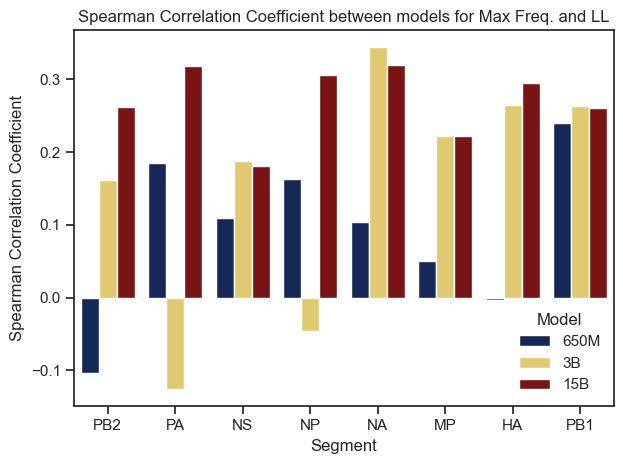

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

model_order = ['650M', '3B', '15B']

palette = {
    '650M': '#0a2463',
    '3B': '#f4d35e',
    '15B': '#890304'
}

results_df['Model'] = pd.Categorical(
    results_df['Model'], 
    categories=model_order, 
    ordered=True
)

results_df = results_df.sort_values('Model')

#sns.color_palette("pastel")

sns.barplot(
    data=results_df, 
    x='Segment', 
    y='Spearman Correlation Coefficient between Max Frequency and LL', 
    hue='Model', 
    hue_order=model_order,  
    errorbar=None,
    palette=palette
)

plt.title("Spearman Correlation Coefficient between models for Max Freq. and LL")
plt.xlabel("Segment")
plt.ylabel("Spearman Correlation Coefficient")
plt.legend(title="Model",frameon=False, loc='lower right')
plt.tight_layout()

plt.show()

In [97]:
import json
import sys

# Directory path
#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t33_650M_UR50D"
directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t36_3B_UR50D"
#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t48_15B_UR50D"
#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_Fine_Tune_esm2_t33_650M_UR50D"
#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_Fine_Tune_esm2_t36_3B_UR50D"

#output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_Trees_650M/")
output_dir = os.path.join(directory, "/Users/Carlos/Desktop/Bedford/esm-selection/ESM_Trees_3B/")
#output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_Trees_15B/")
#output_dir = os.path.join(directory, "/Users/Carlos/Downloads/ESM_Trees_650M_Fine_Tune/")
#output_dir = os.path.join(directory, "/Users/Carlos/Desktop/Bedford/esm-selection/ESM_Trees_3B_Fine_Tune/")

# Create output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# Loop through all CSV files in the directory
for filename in os.listdir(directory):
    if filename.endswith(".csv"):
        file_path = os.path.join(directory, filename)

        base_name = filename.rsplit('_', 1)[-1].replace('.csv', '')

        #LL_freq_file = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood/Max_Freq_Fasta_LL_mp.csv"

        LL_freq_file_df = pd.read_csv(file_path)

        if base_name == "pa":
          LL_freq_file_df = LL_freq_file_df[LL_freq_file_df['node'] != 'A/Viamao/LACENRS-974/2015']

        formatted_dict = {
            "nodes": {
                key: {"ESM_score": value}
                for key, value in zip(LL_freq_file_df["node"], LL_freq_file_df["log_likelyhood"])
            }
        }

        # Filepath to save the JSON file
        #output_file = "/Users/Carlos/Downloads/mp_Nodes_ESM.json"

        # Export dictionary as JSON
        #with open(output_file, "w") as json_file:
        #    json.dump(formatted_dict, json_file, indent=4)
            
        #with open(sys.argv[1], 'r') as fh:
        with open(f"/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/h3n2_Sequences/h3n2_60y_{base_name}.json", 'r') as fh:
          dataset = json.load(fh)

        #with open(sys.argv[2]) as fh:
        #with open("/Users/Carlos/Downloads/mp_Nodes_ESM.json") as fh:
        node_data = formatted_dict
        
        esm_scores = {name: info["ESM_score"] for name, info in node_data['nodes'].items()}

        def recurse(n):
          if n["name"] in esm_scores:
            n["node_attrs"]["ESM_score"] = {"value": esm_scores[n["name"]]}
          for c in n.get("children", []):
            recurse(c)

        recurse(dataset["tree"])

        # add a coloring entry
        dataset['meta']["colorings"].insert(0, {"key": "ESM_score", "title": "esm scores", "type": "continuous"})

        #with open(f"/Users/Carlos/Downloads/ESM_Trees_650M/{base_name}_ESM_Tree.json", 'w') as fh:
        #with open(f"/Users/Carlos/Downloads/ESM_Trees_3B/{base_name}_ESM_Tree.json", 'w') as fh:
        with open(f"{output_dir}/{base_name}_ESM_Tree.json", 'w') as fh:
          json.dump(dataset, fh, indent=2)

In [102]:
# Merge fine tune and 650M model

parent_directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline"

dataframes = []

for folder_name in os.listdir(parent_directory):
    folder_path = os.path.join(parent_directory, folder_name)
    
    if os.path.isdir(folder_path):
        #if "max_freqs_log_likelyhood_Fine_Tune_esm2_t33_650M_UR50D" in folder_name or "max_freqs_log_likelyhood_esm2_t33_650M_UR50D" in folder_name: 
        if "max_freqs_log_likelyhood_esm2_t36_3B_UR50D" in folder_name or "max_freqs_log_likelyhood_Fine_Tune_esm2_t36_3B_UR50D" in folder_name: 
            for filename in os.listdir(folder_path):
                if filename.endswith(".csv"):
                    file_path = os.path.join(folder_path, filename)
                    
                    Segment = filename.rsplit('_', 1)[-1].replace('.csv', '')
                    if ("Fine_Tune" in filename) or ("FineTune" in filename):
                        Model = "Fine_Tune_" + filename.rsplit('_', 4)[-3].replace('.csv', '')
                    else:
                        Model = filename.rsplit('_', 4)[-3].replace('.csv', '')

                    df_merge = pd.read_csv(file_path)
                    df_merge['Segment'] = Segment.upper()
                    df_merge['Model'] = Model
                    dataframes.append(df_merge)

                #df_650_FT_DF = pd.concat(dataframes)
                df_3B_FT_DF = pd.concat(dataframes)

df_3B_FT_DF

,node,max_frequency,sequence,log_likelyhood,runtime,Segment,Model
0,NODE_0000001,1.000006,MSLLTEVETYVLSIVPSGPLKAEIAQRLEDVFAGKNTDLEALMEWL...,-56.166397,69.022,MP,Fine_Tune_3B
1,A/Aichi/2/1968-egg,0.083333,MSLLTEVETYVLSIVPSGPLKAEIAQRLEDVFAGKNTDLEALMEWL...,-56.166397,69.022,MP,Fine_Tune_3B
2,NODE_0000002,1.000006,MSLLTEVETYVLSIVPSGPLKAEIAQRLEDVFAGKNTDLEALMEWL...,-56.166397,69.022,MP,Fine_Tune_3B
3,NODE_0000003,0.166666,MSLLTEVETYVLSIVPSGPLKAEIAQRLEDVFAGKNTDLEALMEWL...,-56.166397,69.022,MP,Fine_Tune_3B
4,A/NorthernTerritory/60/1968-egg,0.083333,MSLLTEVETYVLSIVPSGPLKAEIAQRLEDVFAGKNTDLEALMEWL...,-56.166397,69.022,MP,Fine_Tune_3B
...,...,...,...,...,...,...,...
1422,A/Michigan/UOM10049574069/2023,0.062299,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-345.390991,327.000,PA,3B
1423,A/SouthAfrica/PET28958/2023,0.148849,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-345.390991,327.000,PA,3B
1424,NODE_0001008,0.533565,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-346.293213,327.000,PA,3B
1425,A/Singapore/NTF0007/2022,0.533565,MEDFVRQCFNPMIVELAEKAMKEYGEDLKIETNKFAAICTHLEVCF...,-346.293213,327.000,PA,3B


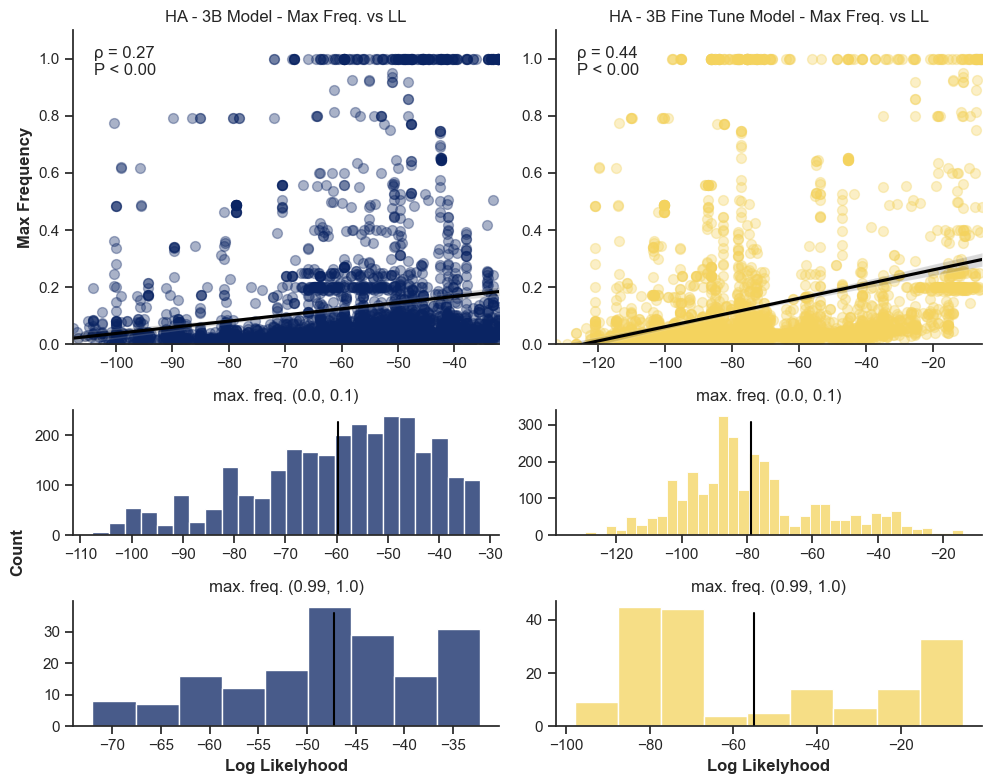

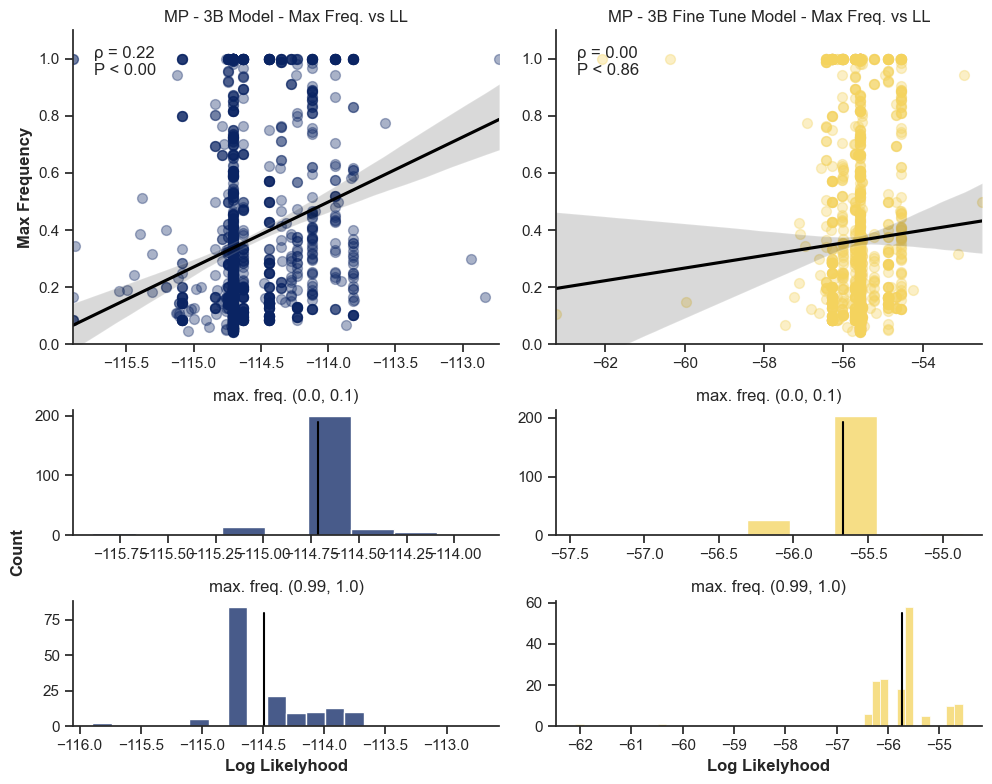

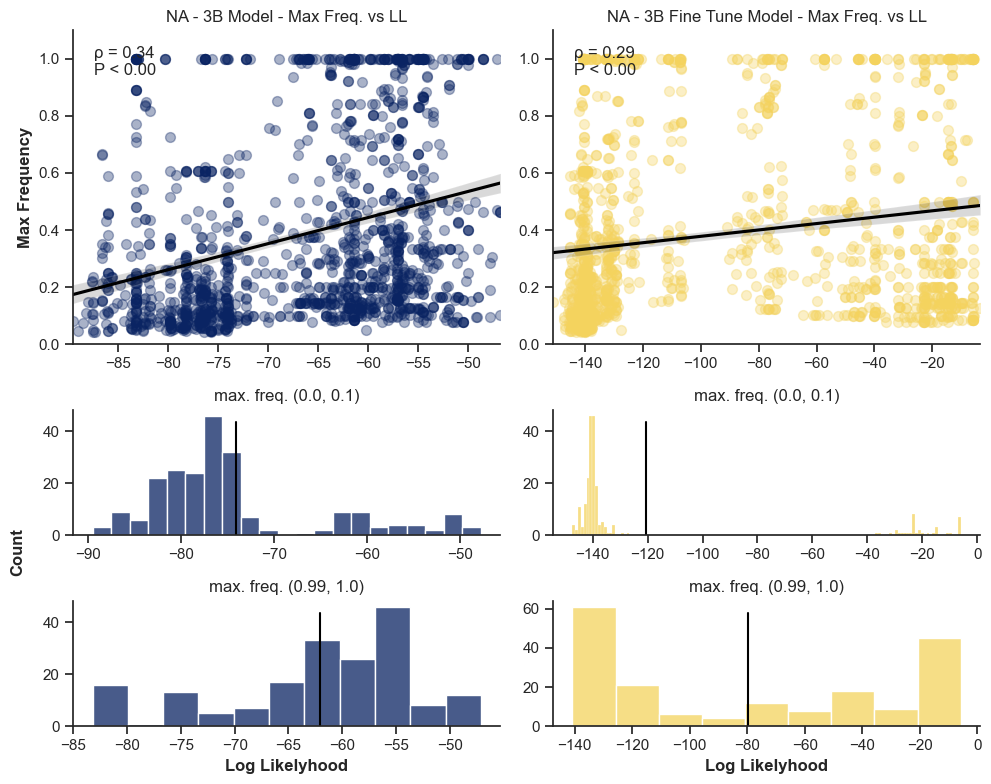

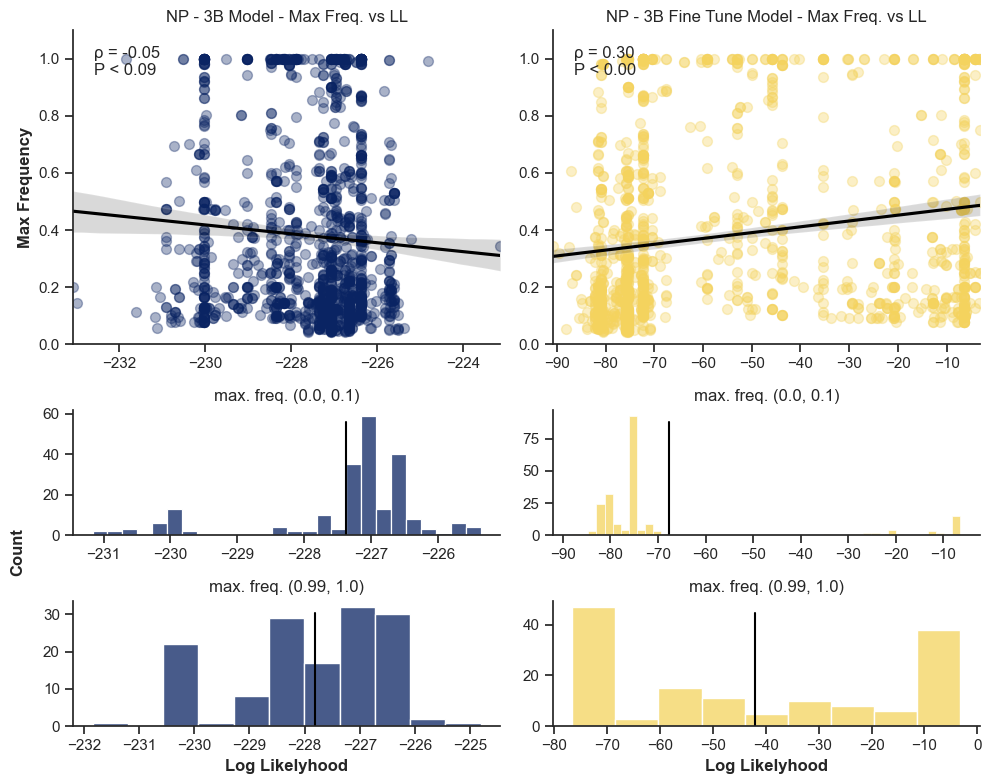

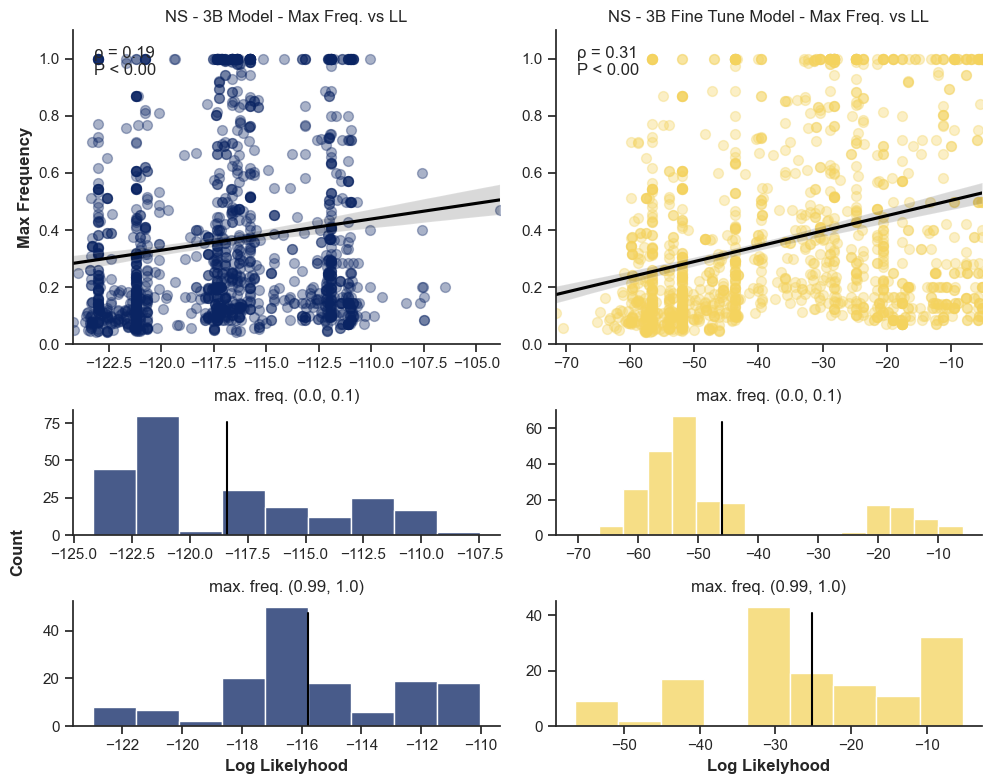

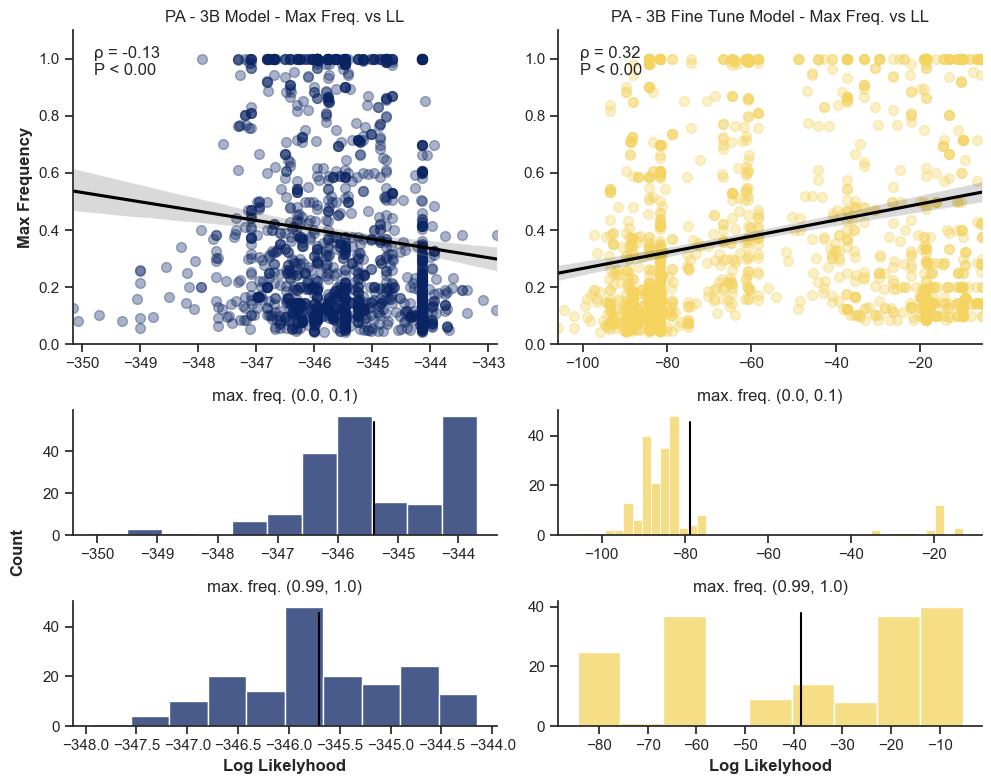

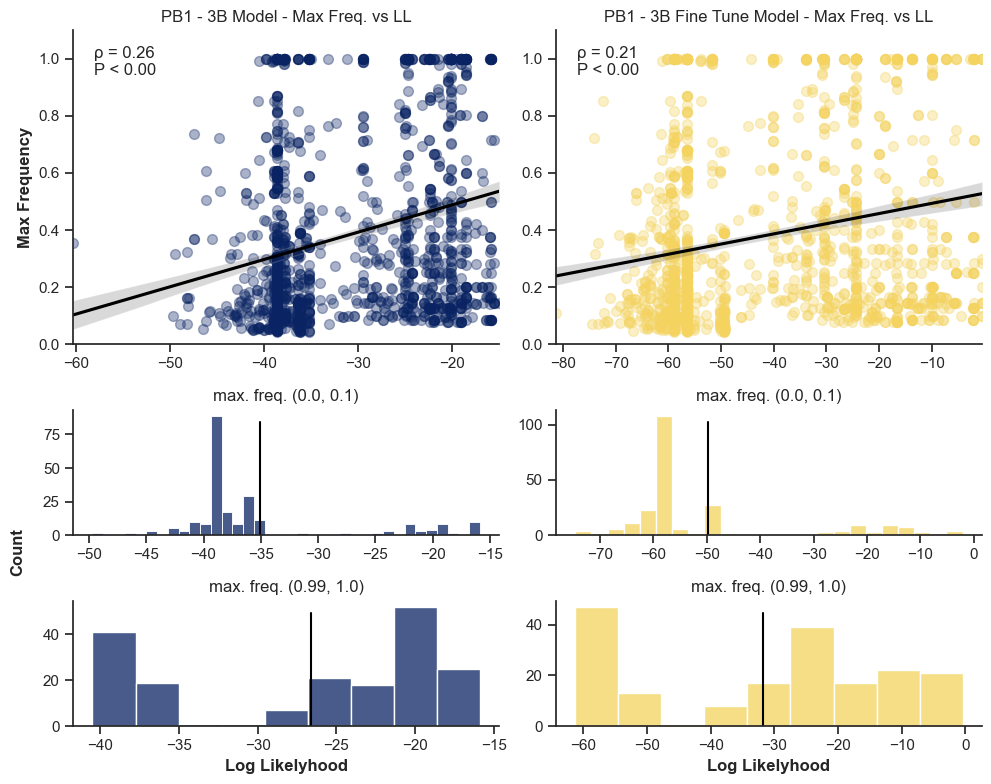

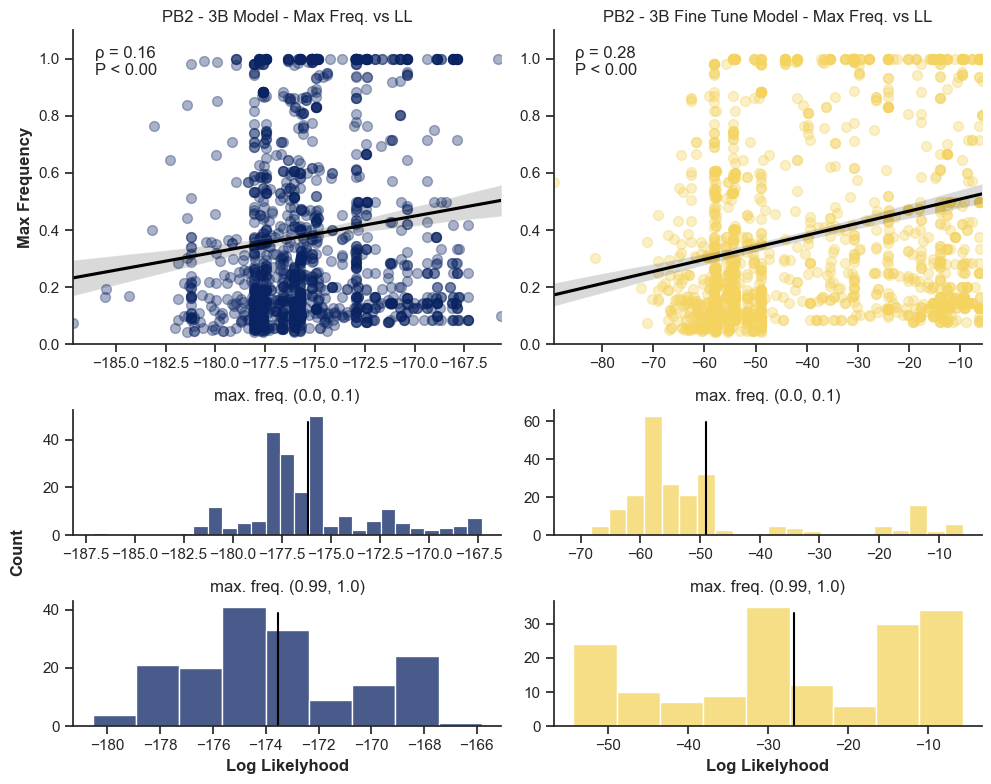

In [101]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from matplotlib import gridspec
from scipy.stats import spearmanr

# Look nicer in Jupyter on Mac
#%config InlineBackend.figure_format = 'retina'

#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood_esm2_t48_15B_UR50D"


sns.set_theme(style="whitegrid")
sns.set_style("ticks")

dataset = df_3B_FT_DF
#dataset = df_650_FT_DF
model = "3B"
#model = "650M"

output_dir = os.path.join(f"/Users/Carlos/Desktop/Bedford/esm-selection/ESM_vs_Max_Freq_Plots_Fine_Tune_{model}")

os.makedirs(output_dir, exist_ok=True)

def plot_regression(ax, data, x_col, y_col, title, ylabel="", color="#0a2463"):
    sns.regplot(data=data, y=y_col, x=x_col, ax=ax, scatter_kws={'s': 50, 'alpha': 0.35, 'color': color}, line_kws={'color': 'black'})
    ax.set_title(title)
    ax.set_xlabel("")
    spearman_corr, p_value = spearmanr(data[y_col], data[x_col])
    textstr = (
        f'ρ = {spearman_corr:.2f}\n'
        f'P < {p_value:.2f}\n'
    )
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=12,
            verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.0))
    ax.set_ylabel(ylabel, weight='bold')
    ax.set_xlim(data[x_col].min(), data[x_col].max())
    ax.set_ylim(0, 1.1)

def plot_histogram(ax, data, mean_value, title, xlabel="", color="#0a2463"):
    sns.histplot(data=data, x="log_likelyhood", ax=ax, color= color)
    ax.set_title(title)
    ax.axvline(mean_value, color='black', linestyle='-', linewidth=1.5, ymax=0.9)
    ax.set_ylabel("")
    ax.set_xlabel(xlabel, weight='bold' if xlabel else 'normal')

for segment, group in dataset.groupby('Segment'):

    fig = plt.figure(figsize=(5 * 2, 8))
    #gs_main = gridspec.GridSpec(3, 2, height_ratios=[1, 0.4, 0.4])

    df = dataset[dataset['Segment'] == segment]

    if segment == "PA":
        df = df[df['node'] != 'A/Viamao/LACENRS-974/2015']

    df_650 = df[df['Model'] == model]
    df_650_Fine_Tune = df[df['Model'] == ("Fine_Tune_" + model)]

    df_below_1_650 = df_650[df_650['max_frequency'] < 0.1]
    df_above_1_650 = df_650[df_650['max_frequency'] >= 0.99]
    df_below_1_Fine_Tune = df_650_Fine_Tune[df_650_Fine_Tune['max_frequency'] < 0.1]
    df_above_1_Fine_Tune = df_650_Fine_Tune[df_650_Fine_Tune['max_frequency'] >= 0.99]

    gs_main = gridspec.GridSpec(3, 2, height_ratios=[1, 0.4, 0.4])  


    ax = fig.add_subplot(gs_main[0, 0])     
    ax_1 = fig.add_subplot(gs_main[0, 1])    

    ax1 = fig.add_subplot(gs_main[1, 0])      
    ax1_1 = fig.add_subplot(gs_main[1, 1])   

    ax2 = fig.add_subplot(gs_main[2, 0])      
    ax2_1 = fig.add_subplot(gs_main[2, 1])    

    plot_regression(ax, df_650, "log_likelyhood", "max_frequency", f"{segment.upper()} - {model} Model - Max Freq. vs LL", ylabel="Max Frequency")
    plot_regression(ax_1, df_650_Fine_Tune, "log_likelyhood", "max_frequency", f"{segment.upper()} - {model} Fine Tune Model - Max Freq. vs LL", color='#f4d35e')
    #plot_regression(ax_2, df_15B, "log_likelyhood", "max_frequency", f"{segment.upper()} - 15B Model - Max Freq. vs LL", color='#890304')

    mean_below_1_650 = df_below_1_650['log_likelyhood'].mean()
    mean_below_Fine_Tune = df_below_1_Fine_Tune['log_likelyhood'].mean()

    plot_histogram(ax1, df_below_1_650, mean_below_1_650, "max. freq. (0.0, 0.1)")
    plot_histogram(ax1_1, df_below_1_Fine_Tune, mean_below_Fine_Tune, "max. freq. (0.0, 0.1)", color='#f4d35e')
    #plot_histogram(ax1_2, df_below_1_15B, mean_below_1_15B, "max. freq. (0.0, 0.1)", color='#890304')

    mean_above_1_650 = df_above_1_650['log_likelyhood'].mean()
    mean_above_Fine_Tune = df_above_1_Fine_Tune['log_likelyhood'].mean()

    plot_histogram(ax2, df_above_1_650, mean_above_1_650, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood")
    plot_histogram(ax2_1, df_above_1_Fine_Tune, mean_above_Fine_Tune, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood", color='#f4d35e')
    #plot_histogram(ax2_2, df_above_1_15B, mean_above_1_15B, "max. freq. (0.99, 1.0)", xlabel="Log Likelyhood", color='#890304')

    for axis in [ax, ax_1, ax_2, ax1, ax2, ax1_1, ax2_1, ax1_2, ax2_2]:
        axis.spines[['right', 'top']].set_visible(False)

    fig.text(0.01, 0.3, 'Count', va='center', rotation='vertical', fontsize=12, weight='bold')
    plt.tight_layout()

    plt.savefig(f"{output_dir}/{segment}_LL_vs_Max_Frequency_Fine_Tune_{model}.png", dpi=300)



In [105]:
#import os 

#directory = "/Users/Carlos/Desktop/Bedford/esm-selection/Flu_Snakemake_Pipeline/max_freqs_log_likelyhood"

results = []

for model, group in df_3B_FT_DF.groupby('Model'):
  for segment, group in df_3B_FT_DF.groupby('Segment'):
    
    df = df_3B_FT_DF[df_3B_FT_DF['Segment'] == segment]
    df = df[df['Model'] == model]

    if base_name == "pa":
      df = df[df['node'] != 'A/Viamao/LACENRS-974/2015']

    df_below_01 = df[df['max_frequency'] < 0.1]
    df_above_1 = df[df['max_frequency'] >= 0.99]
    
    spearman_corr, p_value = spearmanr(df['max_frequency'], df['log_likelyhood'])

    results.append({
        "Model": model,
        "Segment": segment,
        "Spearman Correlation Coefficient between Max Frequency and LL": spearman_corr,
        "P-value": p_value,
        "Mean ESM LL below 0.1": df_below_01['log_likelyhood'].mean(),
        "Mean ESM LL above 0.99": df_above_1['log_likelyhood'].mean(),
        "Difference in LL ESM Means": df_above_1['log_likelyhood'].mean() - df_below_01['log_likelyhood'].mean()
    })

    results_df = pd.DataFrame(results)

print(results_df)

results_df.to_csv("/Users/Carlos/Downloads/ESM_vs_Max_Freq_Summary_Fine_Tune_3B_Statistics.csv", index=False)

results_df


           Model Segment  \
0             3B      HA   
1             3B      MP   
2             3B      NA   
3             3B      NP   
4             3B      NS   
5             3B      PA   
6             3B     PB1   
7             3B     PB2   
8   Fine_Tune_3B      HA   
9   Fine_Tune_3B      MP   
10  Fine_Tune_3B      NA   
11  Fine_Tune_3B      NP   
12  Fine_Tune_3B      NS   
13  Fine_Tune_3B      PA   
14  Fine_Tune_3B     PB1   
15  Fine_Tune_3B     PB2   

    Spearman Correlation Coefficient between Max Frequency and LL  \
0                                            0.265349               
1                                            0.221673               
2                                            0.343861               
3                                           -0.045676               
4                                            0.187753               
5                                           -0.126028               
6                                       

,Model,Segment,Spearman Correlation Coefficient between Max Frequency and LL,P-value,Mean ESM LL below 0.1,Mean ESM LL above 0.99,Difference in LL ESM Means
0,3B,HA,0.265349,4.927952e-63,-59.677744,-47.239139,12.438606
1,3B,MP,0.221673,5.455872e-17,-114.716092,-114.491225,0.224867
2,3B,NA,0.343861,7.232059e-42,-74.121619,-62.088139,12.033480
3,3B,NP,-0.045676,8.939625e-02,-227.370841,-227.821424,-0.450584
4,3B,NS,0.187753,1.905926e-12,-118.379142,-115.782741,2.596401
5,3B,PA,-0.126028,1.806241e-06,-345.395958,-345.703195,-0.307237
6,3B,PB1,0.262873,1.260035e-24,-35.105050,-26.595025,8.510025
7,3B,PB2,0.161110,5.506921e-10,-176.195717,-173.523823,2.671894
8,Fine_Tune_3B,HA,0.440480,1.893979e-182,-78.792187,-55.205132,23.587055
9,Fine_Tune_3B,MP,0.004717,8.602896e-01,-55.667998,-55.733361,-0.065363


In [104]:
results_df

results_df.groupby('Model')['Spearman Correlation Coefficient between Max Frequency and LL'].mean()

Model
3B              0.158864
Fine_Tune_3B    0.269408
Name: Spearman Correlation Coefficient between Max Frequency and LL, dtype: float64

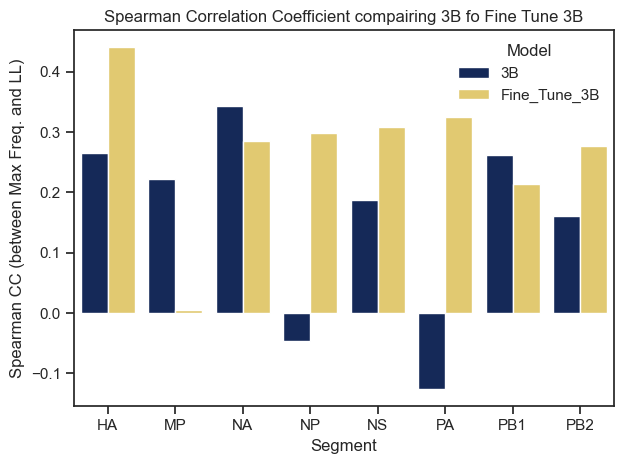

In [110]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

model_order = ['3B', 'Fine_Tune_3B']

palette = {
    '3B': '#0a2463',
    'Fine_Tune_3B': '#f4d35e',
}

results_df['Model'] = pd.Categorical(
    results_df['Model'], 
    categories=model_order, 
    ordered=True
)

results_df = results_df.sort_values('Model')

#sns.color_palette("pastel")

sns.barplot(
    data=results_df, 
    x='Segment', 
    y='Spearman Correlation Coefficient between Max Frequency and LL', 
    hue='Model', 
    hue_order=model_order,  
    errorbar=None,
    palette=palette
)

plt.title("Spearman Correlation Coefficient compairing 3B fo Fine Tune 3B")
plt.xlabel("Segment")
plt.ylabel("Spearman CC (between Max Freq. and LL)")
plt.legend(title="Model",frameon=False, loc='upper right')
plt.tight_layout()

plt.show()

In [48]:
import argparse
from augur.utils import annotate_parents_for_tree
import Bio.Phylo
import json
import pandas as pd
import sys


def json_to_tree(json_dict, root=True, parent_cumulative_branch_length=None):
    """Returns a Bio.Phylo tree corresponding to the given JSON dictionary exported
    by `tree_to_json`.
    Assigns links back to parent nodes for the root of the tree.
    Test opening a JSON from augur export v1.
    >>> import json
    >>> json_fh = open("tests/data/json_tree_to_nexus/flu_h3n2_ha_3y_tree.json", "r")
    >>> json_dict = json.load(json_fh)
    >>> tree = json_to_tree(json_dict)
    >>> tree.name
    'NODE_0002020'
    >>> len(tree.clades)
    2
    >>> tree.clades[0].name
    'NODE_0001489'
    >>> hasattr(tree, "attr")
    True
    >>> "dTiter" in tree.attr
    True
    >>> tree.clades[0].parent.name
    'NODE_0002020'
    >>> tree.clades[0].branch_length > 0
    True
    Test opening a JSON from augur export v2.
    >>> json_fh = open("tests/data/zika.json", "r")
    >>> json_dict = json.load(json_fh)
    >>> tree = json_to_tree(json_dict)
    >>> hasattr(tree, "name")
    True
    >>> len(tree.clades) > 0
    True
    >>> tree.clades[0].branch_length > 0
    True
    Branch lengths should be the length of the branch to each node and not the
    length from the root. The cumulative branch length from the root gets its
    own attribute.
    >>> tip = [tip for tip in tree.find_clades(terminal=True) if tip.name == "USA/2016/FLWB042"][0]
    >>> round(tip.cumulative_branch_length, 6)
    0.004747
    >>> round(tip.branch_length, 6)
    0.000186
    """
    # Check for v2 JSON which has combined metadata and tree data.
    if root and "meta" in json_dict and "tree" in json_dict:
        json_dict = json_dict["tree"]

    node = Bio.Phylo.Newick.Clade()

    # v1 and v2 JSONs use different keys for strain names.
    if "name" in json_dict:
        node.name = json_dict["name"]
    else:
        node.name = json_dict["strain"]

    # Assign all non-children attributes.
    for attr, value in json_dict.items():
        if attr != "children":
            setattr(node, attr, value)

    # Only v1 JSONs support a single `attr` attribute.
    if hasattr(node, "attr"):
        node.numdate = node.attr.get("num_date")
        node.cumulative_branch_length = node.attr.get("div")

        if "translations" in node.attr:
            node.translations = node.attr["translations"]
    elif hasattr(node, "node_attrs"):
        node.cumulative_branch_length = node.node_attrs.get("div")

    node.branch_length = 0.0
    if parent_cumulative_branch_length is not None and hasattr(node, "cumulative_branch_length"):
        node.branch_length = node.cumulative_branch_length - parent_cumulative_branch_length

    if "children" in json_dict:
        # Recursively add children to the current node.
        node.clades = [
            json_to_tree(
                child,
                root=False,
                parent_cumulative_branch_length=node.cumulative_branch_length
            )
            for child in json_dict["children"]
        ]

    if root:
        node = annotate_parents_for_tree(node)

    return node


if __name__ == "__main__":
    parser = argparse.ArgumentParser()
    parser.add_argument("--tree", required=True, help="auspice tree JSON")
    parser.add_argument("--output-metadata", help="tab-delimited file of attributes per node of the given tree")
    parser.add_argument("--output-tree", help="Newick version of the given tree")
    parser.add_argument("--include-internal-nodes", action="store_true", help="include data from internal nodes in metadata output")
    parser.add_argument("--attributes", nargs="+", help="names of attributes to export from the given tree in the metadata output")

    args = parser.parse_args()

    # Load tree from JSON.
    with open(args.tree, "r", encoding="utf-8") as fh:
        tree_json = json.load(fh)

    tree = json_to_tree(tree_json)

    # Output the tree, if requested.
    if args.output_tree:
        Bio.Phylo.write(
            tree,
            args.output_tree,
            "newick",
        )

    if args.output_metadata:
        # Collect attributes per node from the tree to export.
        records = []

        if args.attributes:
            attributes = args.attributes
        else:
            attributes = sorted(
                set(tree.root.node_attrs.keys()) |
                set(tree.root.branch_attrs.keys())
            )

        for node in tree.find_clades():
            if node.is_terminal() or args.include_internal_nodes:
                record = {
                    "name": node.name
                }

                for attribute in attributes:
                    if attribute in node.node_attrs:
                        value = node.node_attrs[attribute]
                    elif attribute in node.branch_attrs:
                        value = node.branch_attrs[attribute]
                    else:
                        print(f"Could not find attribute '{attribute}' for node '{node.name}'.", file=sys.stderr)
                        value = None

                    if value is not None:
                        if isinstance(value, dict) and "value" in value:
                            value = value["value"]

                    record[attribute] = value

                records.append(record)

        # Convert records to a data frame and save as a tab-delimited file.
        df = pd.DataFrame(records)
        df.to_csv(
            args.output_metadata,
            sep="\t",
            header=True,
            index=False,
            columns=["name"] + list(attributes),
        )

usage: ipykernel_launcher.py [-h] --tree TREE
                             [--output-metadata OUTPUT_METADATA]
                             [--output-tree OUTPUT_TREE]
                             [--include-internal-nodes]
                             [--attributes ATTRIBUTES [ATTRIBUTES ...]]
ipykernel_launcher.py: error: the following arguments are required: --tree


SystemExit: 2

/Users/Carlos/Library/Python/3.9/lib/python/site-packages/IPython/core/interactiveshell.py:3558: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [98]:
# Filepath to the JSON file
#file_path = "/Users/Carlos/Downloads/ESM_Trees_3B_Fine_Tune/ha_ESM_Tree.json"
file_path = "/Users/Carlos/Downloads/ESM_Trees_3B/ha_ESM_Tree.json"

# Open and load JSON file as a dictionary
with open(file_path, 'r') as file:
    data = json.load(file)

tree = json_to_tree(data)

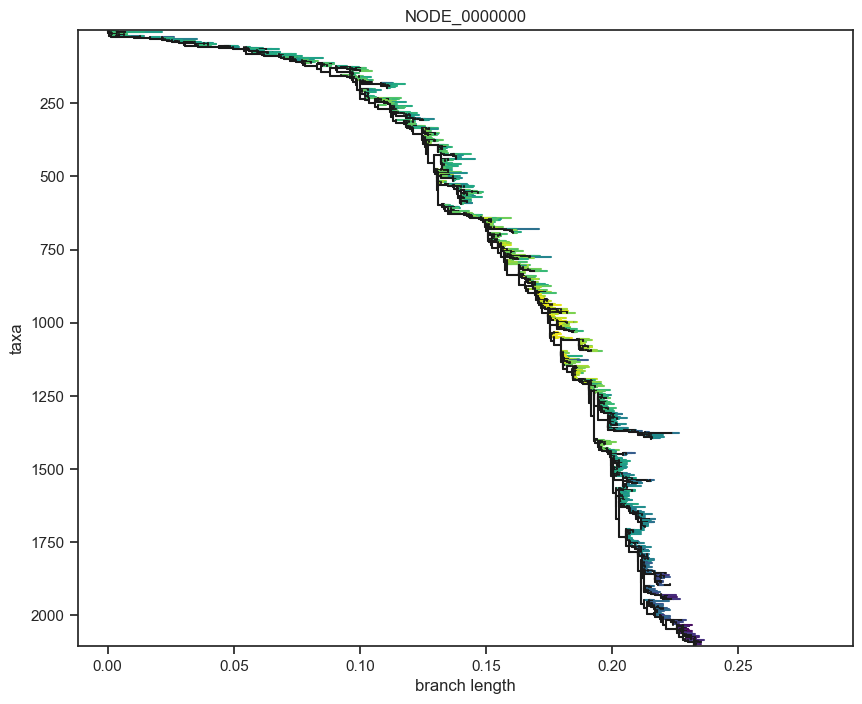

In [100]:
from Bio import Phylo
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib import colormaps

# Extract ESM scores
esm_scores = {}
for clade in tree.get_terminals():
    try:
        score = clade.node_attrs['ESM_score']['value']
        esm_scores[clade] = score
    except (AttributeError, KeyError, TypeError):
        continue

# Normalize and get colormap
norm = mcolors.Normalize(vmin=min(esm_scores.values()), vmax=max(esm_scores.values()))
cmap = colormaps.get_cmap("viridis")

# Assign colors using hex format
for clade, score in esm_scores.items():
    rgba = cmap(norm(score))
    hex_color = mcolors.to_hex(rgba)  # <-- Convert to "#RRGGBB"
    clade.color = hex_color

# Draw tree
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(1, 1, 1)
Phylo.draw(tree, axes=ax, label_func=lambda x: "", do_show=False)
plt.show()


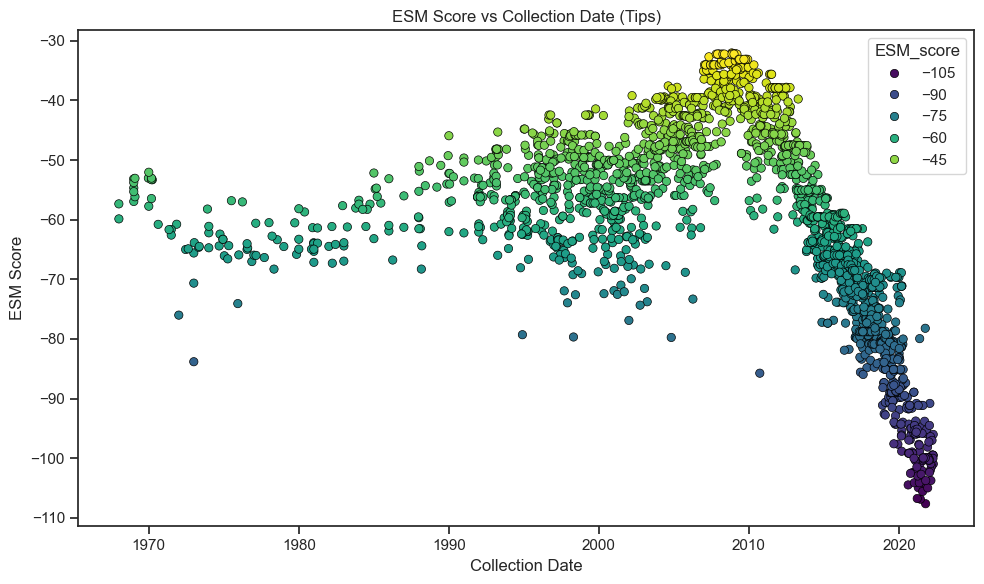

In [106]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

file_path = "/Users/Carlos/Downloads/ESM_Trees_3B/ha_ESM_Tree.json"

# Open and load JSON file as a dictionary
with open(file_path, 'r') as file:
    data = json.load(file)

tree = json_to_tree(data)

# Build DataFrame from clade metadata
data = []
for clade in tree.get_terminals():
    try:
        data.append({
            "date": clade.node_attrs['num_date']['value'],
            "ESM_score": clade.node_attrs['ESM_score']['value'],
            "label": clade.name
        })
    except (KeyError, TypeError, AttributeError):
        continue

df = pd.DataFrame(data)

# Plot using seaborn
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=df,
    x="date",
    y="ESM_score",
    hue="ESM_score",
    palette="viridis",
    edgecolor="black"
)

scatter.set_title("ESM Score vs Collection Date (Tips)")
scatter.set_xlabel("Collection Date")
scatter.set_ylabel("ESM Score")
#plt.colorbar(scatter.collections[0], label="ESM Score")
plt.tight_layout()
plt.show()


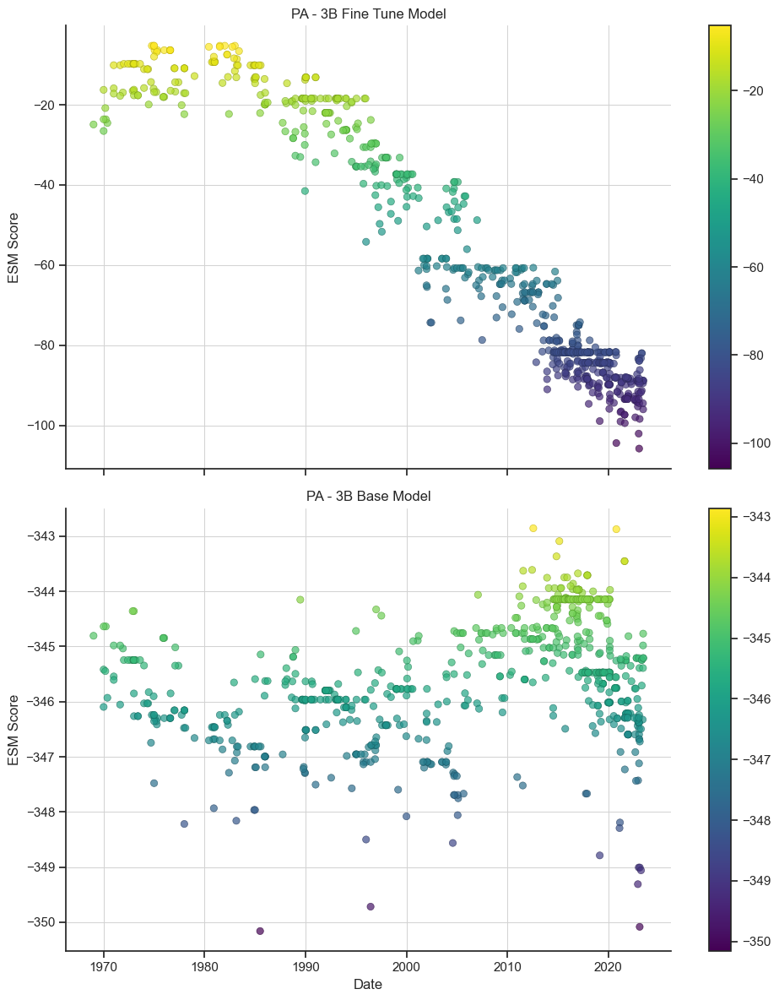

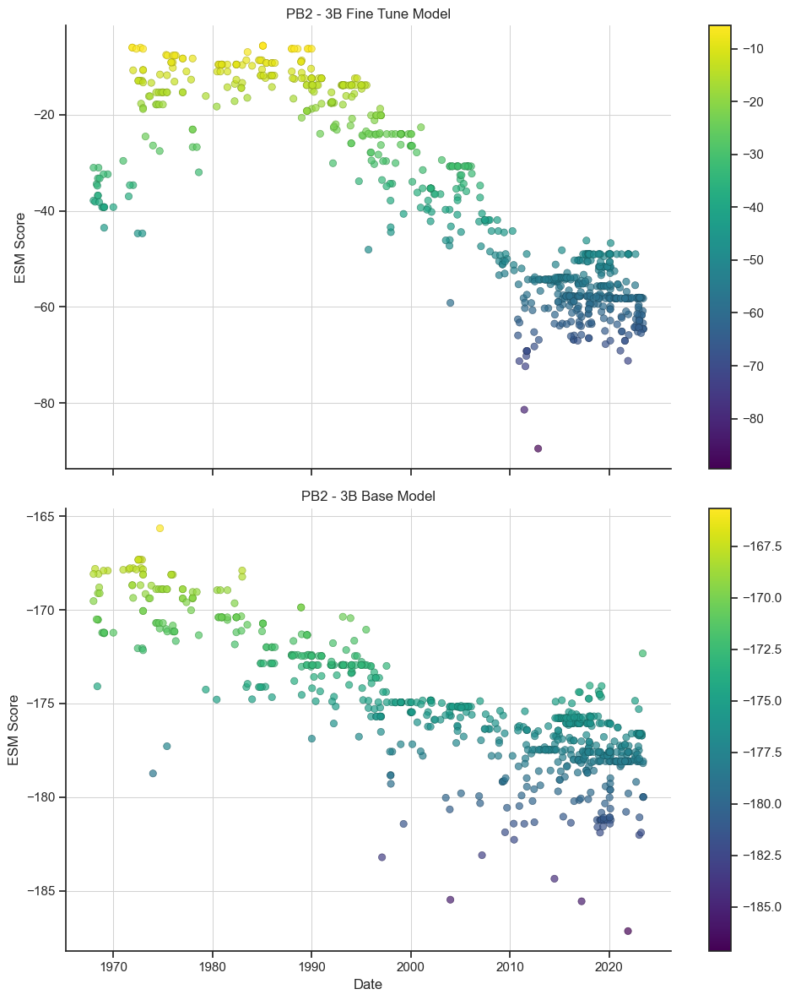

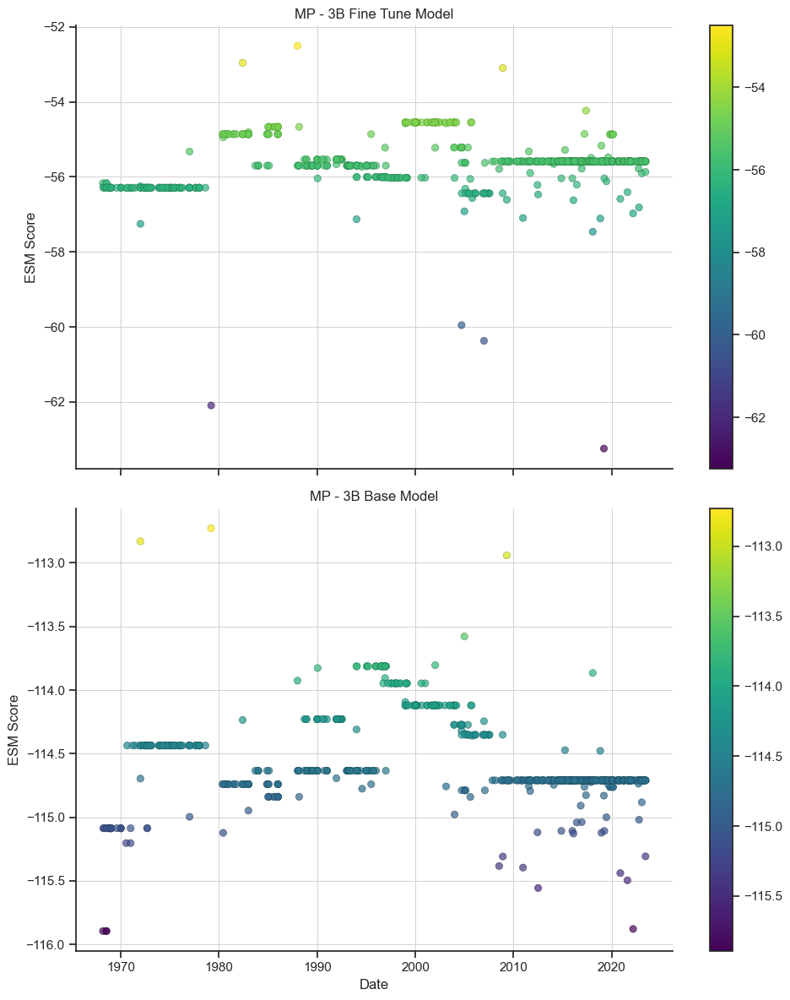

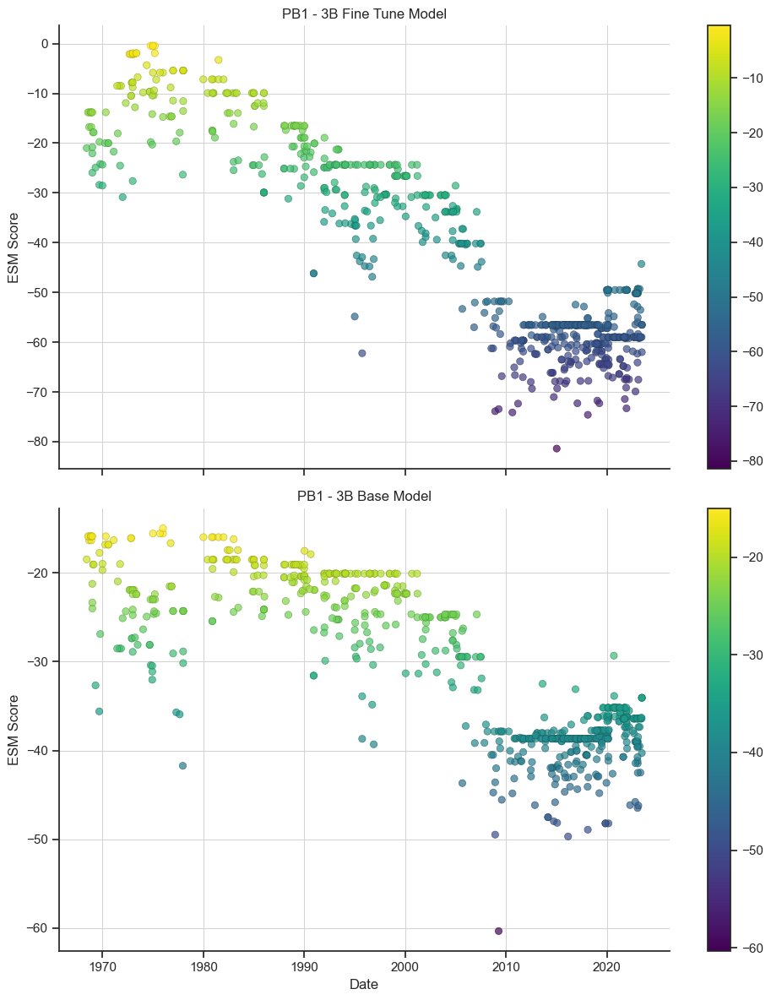

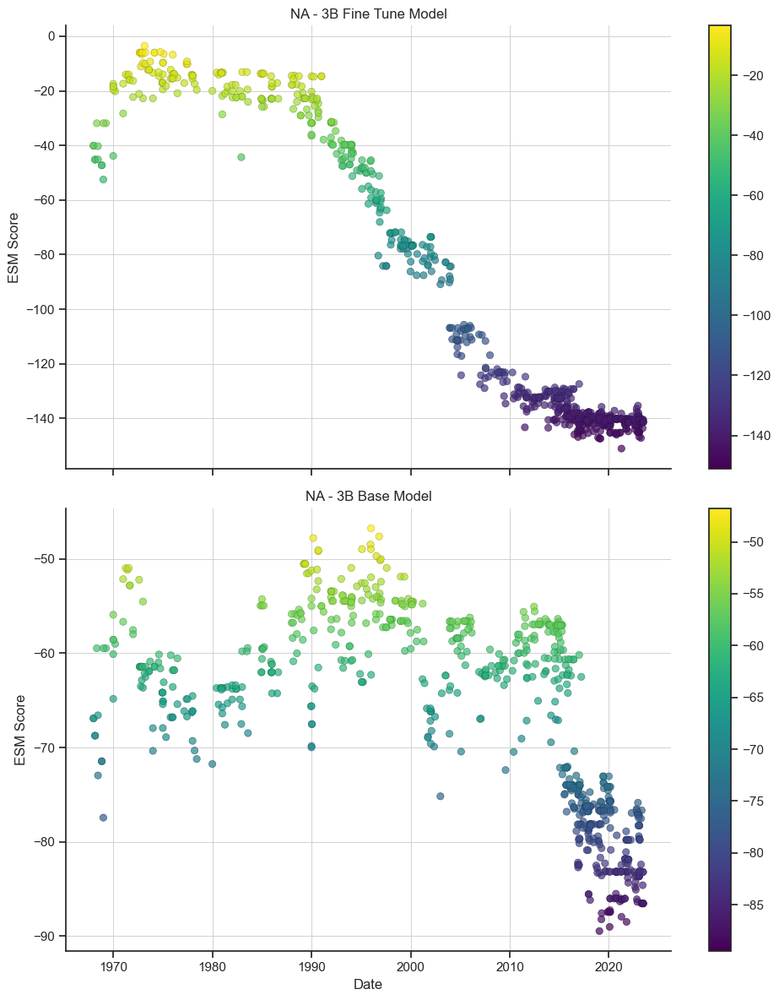

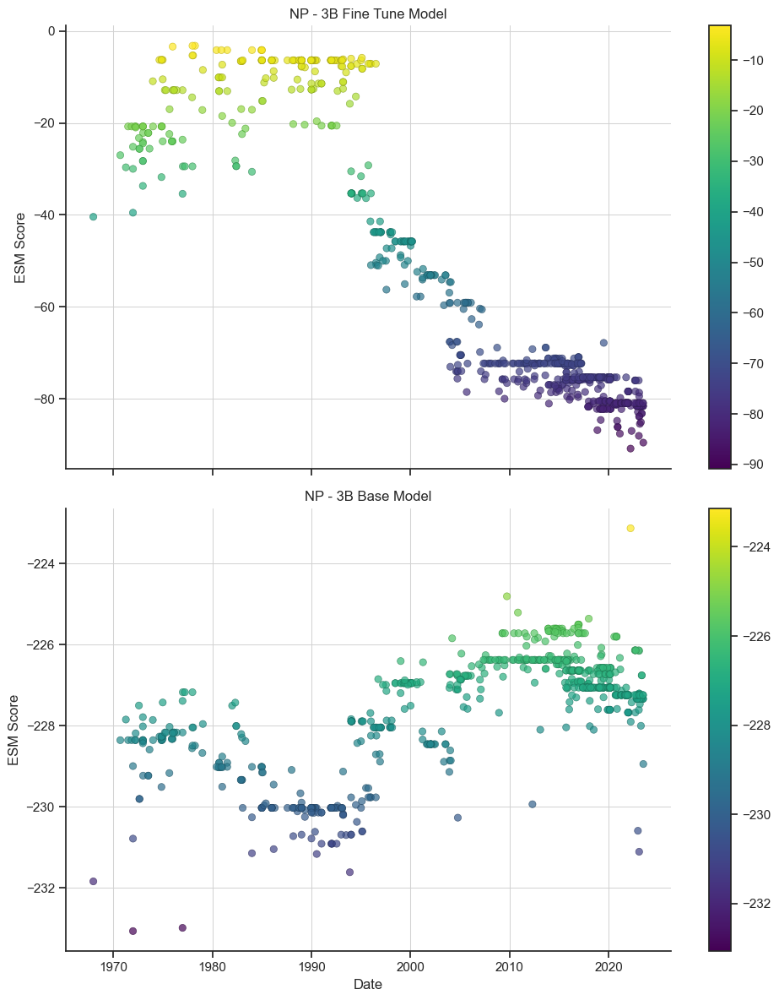

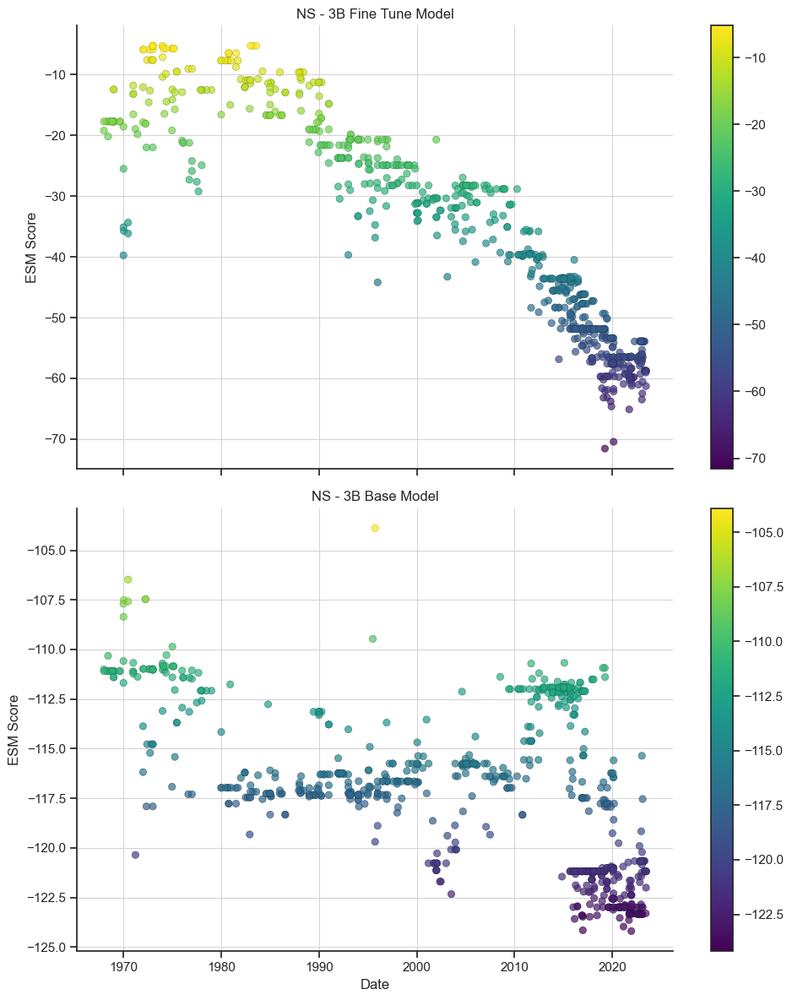

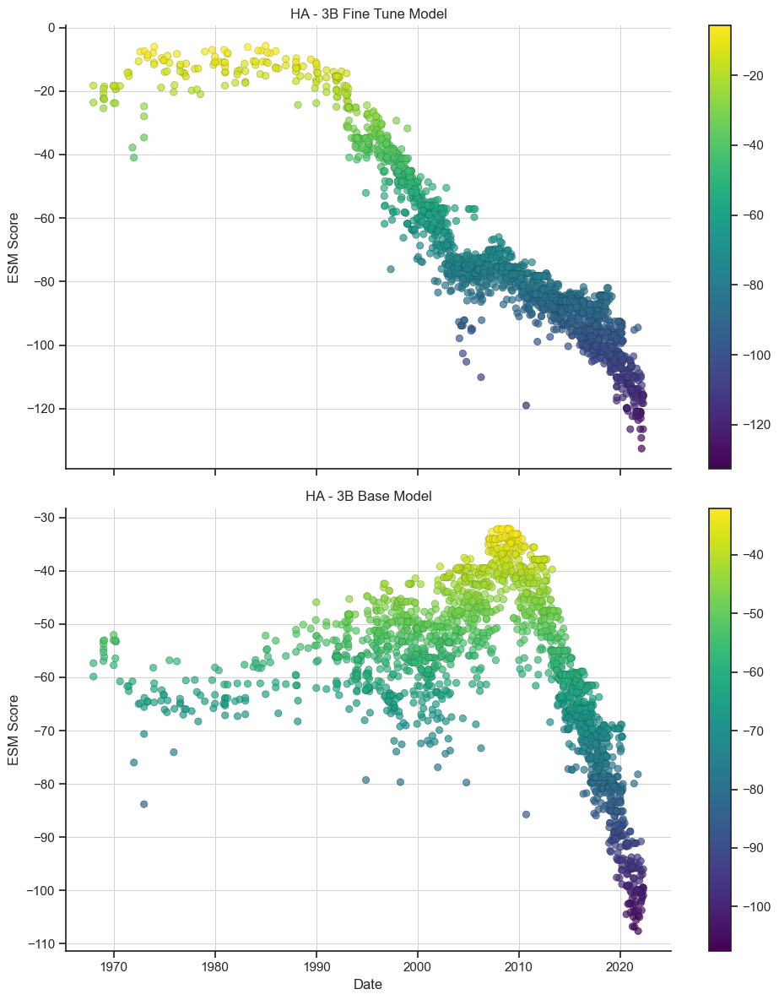

In [186]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as mcolors
import colorsys
import json
import matplotlib.cm as cm
import numpy as np
import os


directory = "/Users/Carlos/Downloads/ESM_Trees_3B"

for filename in os.listdir(directory):
    if filename.endswith("_ESM_Tree.json"):
        file_path = os.path.join(directory, filename)
        segment = filename.split("_")[0]

        file_path_1 = f"/Users/Carlos/Downloads/ESM_Trees_3B_Fine_Tune/{segment}_ESM_Tree.json"
        file_path_2 = f"/Users/Carlos/Downloads/ESM_Trees_3B/{segment}_ESM_Tree.json"

        def load_json_to_df(file_path):
            with open(file_path, 'r') as file:
                data = json.load(file)
            tree = json_to_tree(data)
            records = []
            for clade in tree.get_terminals():
                try:
                    records.append({
                        "date": clade.node_attrs['num_date']['value'],
                        "ESM_score": clade.node_attrs['ESM_score']['value'],
                        "label": clade.name
                    })
                except (KeyError, TypeError, AttributeError):
                    continue
            return pd.DataFrame(records)

        def darken_color(rgb, factor=0.7):
            h, l, s = colorsys.rgb_to_hls(*rgb)
            r, g, b = colorsys.hls_to_rgb(h, max(0, l * factor), s)
            return (r, g, b, 1.0)

        def plot_esm_score(ax, df, title):
            norm = plt.Normalize(df["ESM_score"].min(), df["ESM_score"].max())
            cmap = plt.get_cmap("viridis")
            colors = cmap(norm(df["ESM_score"]))
            edgecolors = [darken_color(c[:3], factor=0.7) for c in colors]
            sc = ax.scatter(
                df["date"],
                df["ESM_score"],
                c=colors,
                edgecolors=edgecolors,
                linewidths=0.5,
                alpha=0.7
            )
            sm = cm.ScalarMappable(cmap=cmap, norm=norm)
            sm.set_array([])
            cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
            #cbar.set_label("ESM Score")
            ax.set_title(title)
            ax.set_ylabel("ESM Score")
            ax.grid(True, color='lightgray', linestyle='-', linewidth=0.75)
            ax.spines[['right', 'top']].set_visible(False)
            return ax

        df1 = load_json_to_df(file_path_1)
        df2 = load_json_to_df(file_path_2)

        fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12), sharex=True)
        plot_esm_score(ax1, df1, f"{segment.upper()} - 3B Fine Tune Model")
        plot_esm_score(ax2, df2, f"{segment.upper()} - 3B Base Model")
        ax2.set_xlabel("Date")

        os.makedirs("/Users/Carlos/Downloads/Combined_3B_v_3B_TN_Scatterplots/", exist_ok=True)
        plt.savefig(f"/Users/Carlos/Downloads/Combined_3B_v_3B_TN_Scatterplots/{segment}_3B_v_3B_TN_Scatterplots.png", dpi=300)

        plt.tight_layout()
        plt.show()


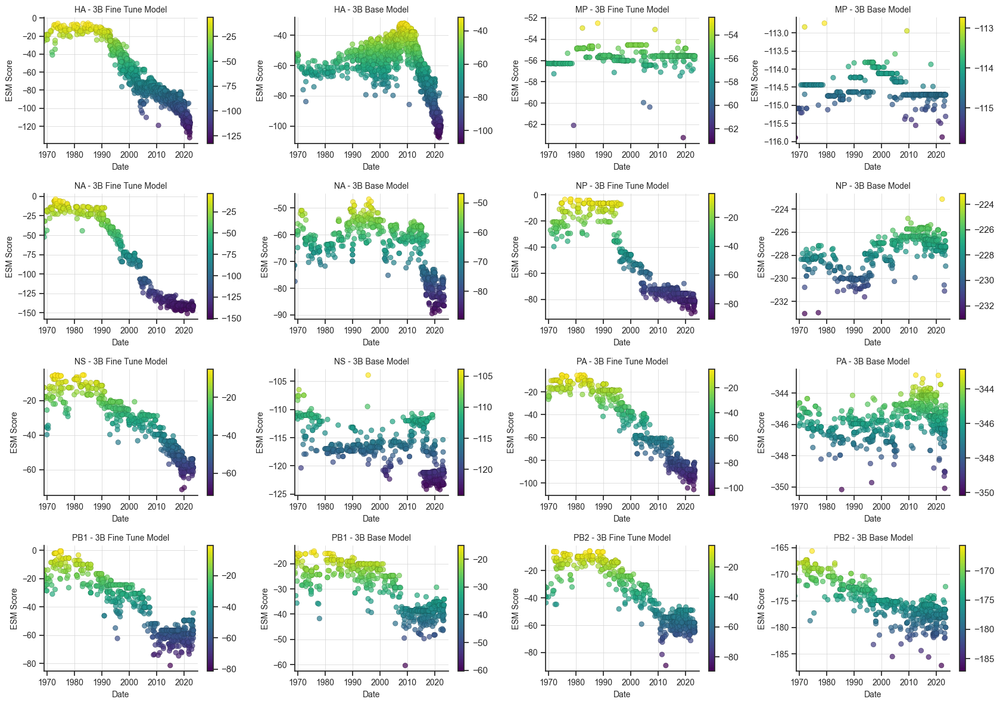

In [184]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as mcolors
import colorsys
import json
import matplotlib.cm as cm
import numpy as np
import os


directory = "/Users/Carlos/Downloads/ESM_Trees_3B"


def load_json_to_df(file_path):
    with open(file_path, 'r') as file:
        data = json.load(file)
    tree = json_to_tree(data)
    records = []
    for clade in tree.get_terminals():
        try:
            records.append({
                "date": clade.node_attrs['num_date']['value'],
                "ESM_score": clade.node_attrs['ESM_score']['value'],
                "label": clade.name
            })
        except (KeyError, TypeError, AttributeError):
            continue
    return pd.DataFrame(records)


def darken_color(rgb, factor=0.7):
    h, l, s = colorsys.rgb_to_hls(*rgb)
    r, g, b = colorsys.hls_to_rgb(h, max(0, l * factor), s)
    return (r, g, b, 1.0)


def plot_esm_score(ax, df, title, xlim):
    norm = plt.Normalize(df["ESM_score"].min(), df["ESM_score"].max())
    cmap = plt.get_cmap("viridis")
    colors = cmap(norm(df["ESM_score"]))
    edgecolors = [darken_color(c[:3], factor=0.7) for c in colors]
    sc = ax.scatter(
        df["date"],
        df["ESM_score"],
        c=colors,
        edgecolors=edgecolors,
        linewidths=0.5,
        alpha=0.7
    )
    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=ax, orientation='vertical')
    ax.set_title(title, fontsize=10)
    ax.set_ylabel("ESM Score", fontsize=10)
    ax.tick_params(labelsize=10)
    ax.set_xlim(xlim)
    ax.grid(True, color='lightgray', linestyle='-', linewidth=0.5)
    ax.spines[['right', 'top']].set_visible(False)


file_list = [f for f in os.listdir(directory) if f.endswith("_ESM_Tree.json")]
file_list.sort()

fig, axes = plt.subplots(4, 4, figsize=(17, 12), sharex=False)
axes = axes.flatten()

plot_idx = 0


all_dates = []

# First pass to collect all date ranges
for filename in file_list:
    segment = filename.split("_")[0]
    file_path_1 = f"/Users/Carlos/Downloads/ESM_Trees_3B_Fine_Tune/{segment}_ESM_Tree.json"
    file_path_2 = f"/Users/Carlos/Downloads/ESM_Trees_3B/{segment}_ESM_Tree.json"

    if not os.path.exists(file_path_1) or not os.path.exists(file_path_2):
        continue

    df1 = load_json_to_df(file_path_1)
    df2 = load_json_to_df(file_path_2)
    all_dates.extend(df1["date"])
    all_dates.extend(df2["date"])

xlim = (1969, 2025)

for filename in file_list:
    segment = filename.split("_")[0]
    file_path_1 = f"/Users/Carlos/Downloads/ESM_Trees_3B_Fine_Tune/{segment}_ESM_Tree.json"
    file_path_2 = f"/Users/Carlos/Downloads/ESM_Trees_3B/{segment}_ESM_Tree.json"

    if not os.path.exists(file_path_1) or not os.path.exists(file_path_2):
        continue

    df1 = load_json_to_df(file_path_1)
    df2 = load_json_to_df(file_path_2)

    ax1 = axes[plot_idx]
    plot_esm_score(ax1, df1, f"{segment.upper()} - 3B Fine Tune Model", xlim)
    ax1.set_xlabel("Date", fontsize=10)
    plot_idx += 1

    ax2 = axes[plot_idx]
    plot_esm_score(ax2, df2, f"{segment.upper()} - 3B Base Model", xlim)
    ax2.set_xlabel("Date", fontsize=10)
    plot_idx += 1

    if plot_idx >= len(axes):
        break

plt.tight_layout()

plt.savefig(f"/Users/Carlos/Downloads/Combined_3B_v_3B_TN_Scatterplots", dpi=300)

plt.show()